In [1]:
import numpy as np
import matplotlib.pyplot as plt
import matplotlib as mpl
import itertools

from matplotlib import cm
import datetime
import time 

from scipy.stats import norm
# Test average window cnn
from scipy.ndimage import uniform_filter
from scipy.ndimage import gaussian_filter

from scipy.sparse import lil_array
from scipy.sparse.linalg import spsolve
from numpy.linalg import solve, norm
from numpy.random import rand

In [2]:
import os 
import sys
sys.path.insert(0, '/Users/ajolaise/Library/CloudStorage/OneDrive-NTNU/PhD/code/CASCADE/src')
from Sinmod import Sinmod
from plotting.SinmodPlotting import SinmodPlotting
from utilis.Grid import Grid

In [3]:
sinmod_path = "/Users/ajolaise/Library/CloudStorage/OneDrive-NTNU/PhD/code/CASCADE/data/sinmod/transfer_382450_files_da8d2b9a"
files = ["BioStates_froshelf.nc", "BioStates_midnor.nc", "mixOut.nc"]
plot_test_path = "/Users/ajolaise/Library/CloudStorage/OneDrive-NTNU/PhD/code/CASCADE/figures/tests/Sinmod/"

file_ind = 2
logging_kwargs = {
    "print_to_console": True,
    "log_file": plot_test_path + "Sinmod_notebook_log.txt",
    "overwrite_file": True
}
boundary_kwargs = {
    "border_file": "/border_files/cascade_test_xy.csv",
    "file_type": "xy"}

sinmod_c = Sinmod(sinmod_path + "/" + files[file_ind ], 
                        plot_path=plot_test_path,
                        log_kwargs=logging_kwargs,
                        boundary_kwargs=boundary_kwargs,
                      print_while_running=True)


2025-05-01 15:12:26    [INFO] [Sinmod] Setting up Sinmod class
2025-05-01 15:12:26    [INFO] [Sinmod] Setting up boundary
2025-05-01 15:12:26    [INFO] [Sinmod] Boundary kwargs: {'border_file': '/border_files/cascade_test_xy.csv', 'file_type': 'xy'}
2025-05-01 15:12:26    [INFO] [Sinmod] Reading file /Users/ajolaise/Library/CloudStorage/OneDrive-NTNU/PhD/code/CASCADE/data/sinmod/transfer_382450_files_da8d2b9a/mixOut.nc
<class 'netCDF4.Dataset'>
root group (NETCDF4 data model, file format HDF5):
    Conventions: CF-1.5
    title: Current data from SINMOD
    institution: SINTEF Ocean
    grid_mapping: grid_mapping
    grid_mapping_name: polar_stereographic
    straight_vertical_longitude_from_pole: 58.0
    horizontal_resolution: 800.0
    coordinate_north_pole: [3181.  2398.5]
    latitude_of_projection_origin: 90.0
    standard_parallel: 60.0
    barotropic_timestep: 3.2142857142857144
    baroclinic_timestep: 90.0
    _FillValue: -32768
    setup: midnor
    relax_e: T
    nested: T


In [4]:
sinmod_c.sinmod_file

<class 'netCDF4.Dataset'>
root group (NETCDF4 data model, file format HDF5):
    Conventions: CF-1.5
    title: Current data from SINMOD
    institution: SINTEF Ocean
    grid_mapping: grid_mapping
    grid_mapping_name: polar_stereographic
    straight_vertical_longitude_from_pole: 58.0
    horizontal_resolution: 800.0
    coordinate_north_pole: [3181.  2398.5]
    latitude_of_projection_origin: 90.0
    standard_parallel: 60.0
    barotropic_timestep: 3.2142857142857144
    baroclinic_timestep: 90.0
    _FillValue: -32768
    setup: midnor
    relax_e: T
    nested: T
    tidal_input: F
    DHA: 10.0
    smagorin: T
    biharmonic: F
    KBi: 0.0
    COLDSTART: F
    ATMODATA: 5
    CM: 0.5
    CM2D: 0.5
    CH: 0.3
    CI: 5.0
    icedyn: T
    tidal_components: [0 0 0 0 0 0 0 0 0 0 0]
    dimensions(sizes): xc(950), yc(555), zc(56), time(108), dummySampleDim(6)
    variables(dimensions): int32 time(time, dummySampleDim), int32 grid_mapping(), float32 LayerDepths(zc), float32 xc(xc)

In [1]:
t_ind = 0
u = sinmod_c.sinmod_file.variables["u_east"][t_ind, :, :, :]
v = sinmod_c.sinmod_file.variables["v_north"][t_ind, :, :, :]
abs_velocity = np.sqrt(u**2 + v**2)
calanus = sinmod_c.sinmod_file.variables["calanus_finmarchicus"][t_ind, :, :]
xc = sinmod_c.sinmod_file.variables["xc"][:]
yc = sinmod_c.sinmod_file.variables["yc"][:]
zc = sinmod_c.sinmod_file.variables["zc"][:]
time_step_s = sinmod_c.sinmod_data["timestamp_seconds"]
dx = xc[1] - xc[0]
dy = yc[1] - yc[0]
dz = zc[1] - zc[0]
dt = time_step_s[1] - time_step_s[0]
print("dx, dy, dz, dt", dx, dy, dz, dt)



NameError: name 'sinmod_c' is not defined

In [2]:
x_inds = np.arange(400,450)
y_inds = np.arange(300,350)

v_min, v_max = np.min(calanus[y_inds,:][:,x_inds]), np.max(calanus[y_inds,:][:,x_inds])
grid = Grid()
grid.make_regular_grid_from_axes(yc[y_inds], xc[x_inds])

plt.scatter(grid.grid[:, 0], grid.grid[:, 1], c=calanus[y_inds,:][:,x_inds].flatten(), s=10)
plt.show()

for i in x_inds:    
    for j in y_inds:
        plt.scatter(j , i , c=calanus[i,j], s=10, vmin=v_min, vmax=v_max)
plt.colorbar()
plt.show()


NameError: name 'np' is not defined

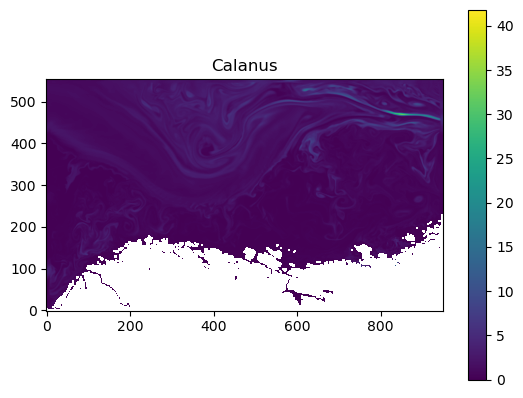

In [7]:
# Plot the calanus
plt.imshow(calanus[:,:], cmap=cm.viridis, origin="lower")
plt.colorbar()
plt.title("Calanus")
plt.show()

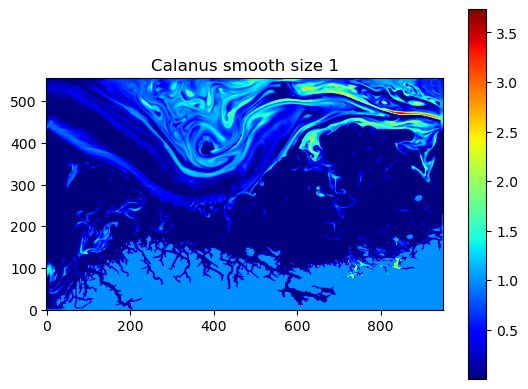

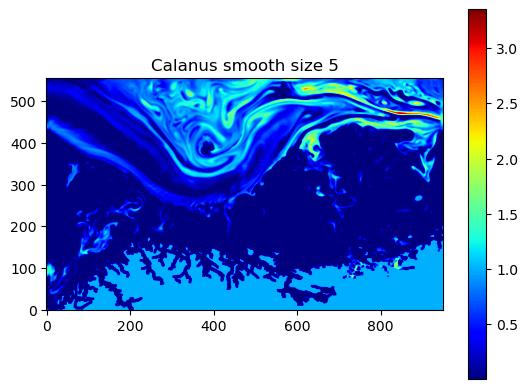

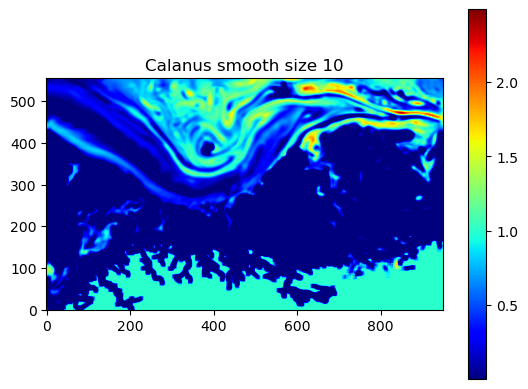

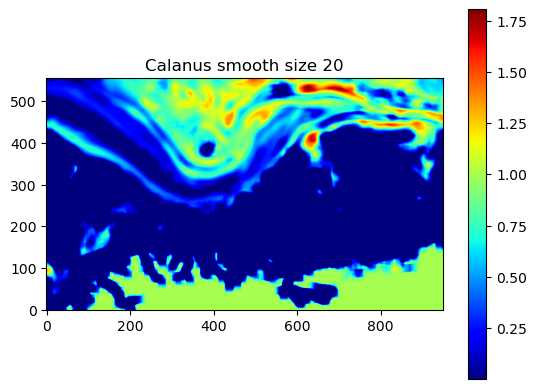

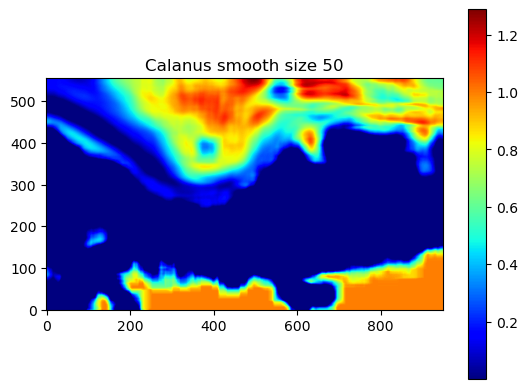

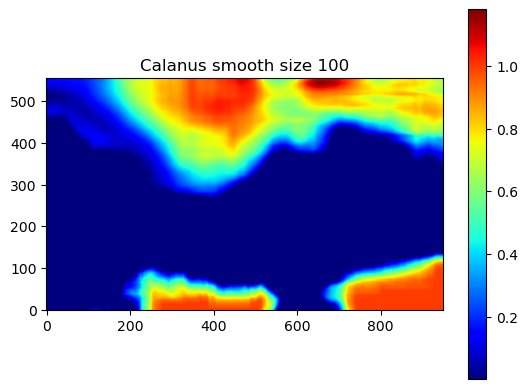

In [9]:
for size in [1,5,10,20, 50, 100]:
    calanus = np.clip(calanus, 10**(-3), None)
    calanus_smooth = uniform_filter(np.log(calanus[:,:]+10**(-5)), size=size)
    calanus_smooth = np.clip(calanus_smooth, 10**(-3),None)
    plt.imshow(calanus_smooth, cmap=cm.jet, origin="lower")
    plt.colorbar()
    plt.title("Calanus smooth size {}".format(size))
    plt.show()




t_ind 0


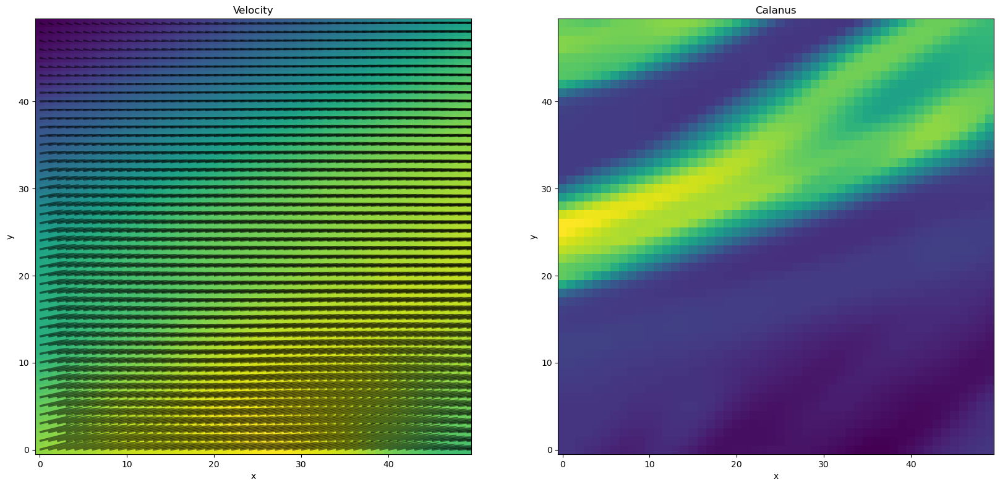

t_ind 5


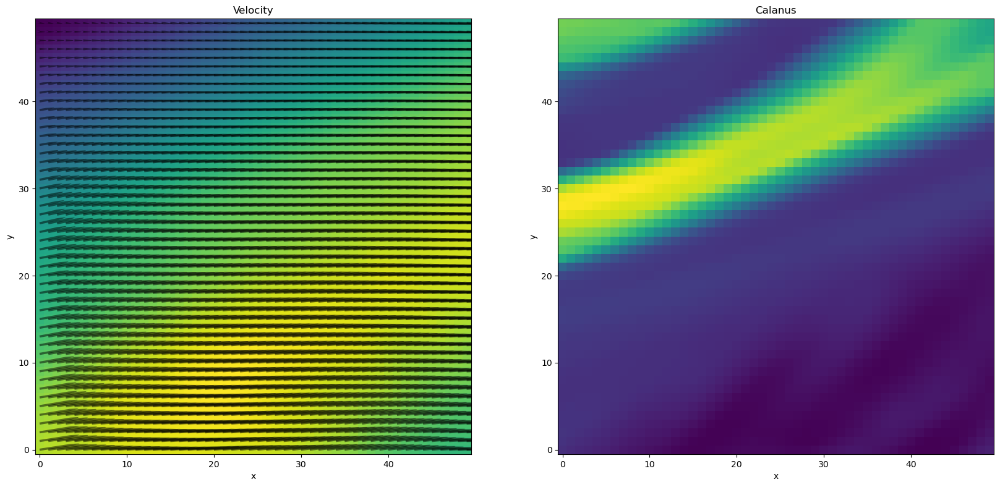

t_ind 10


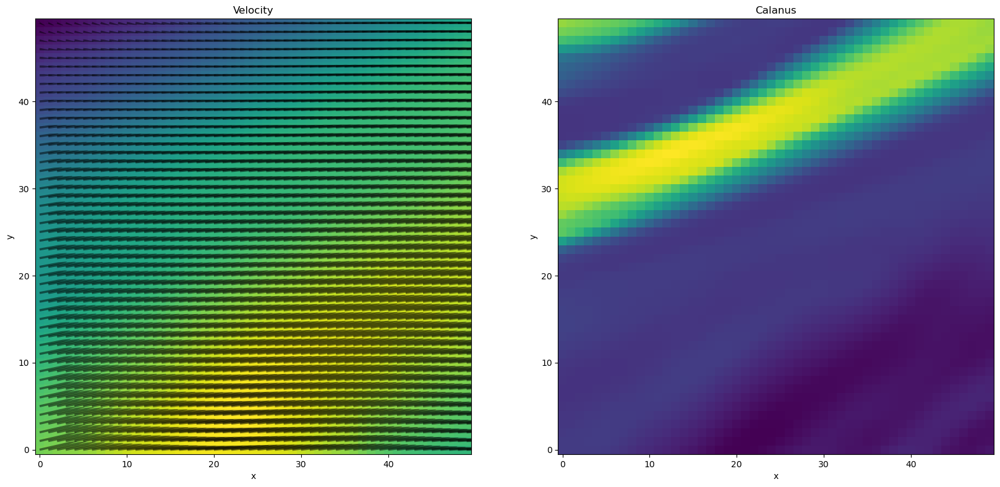

t_ind 15


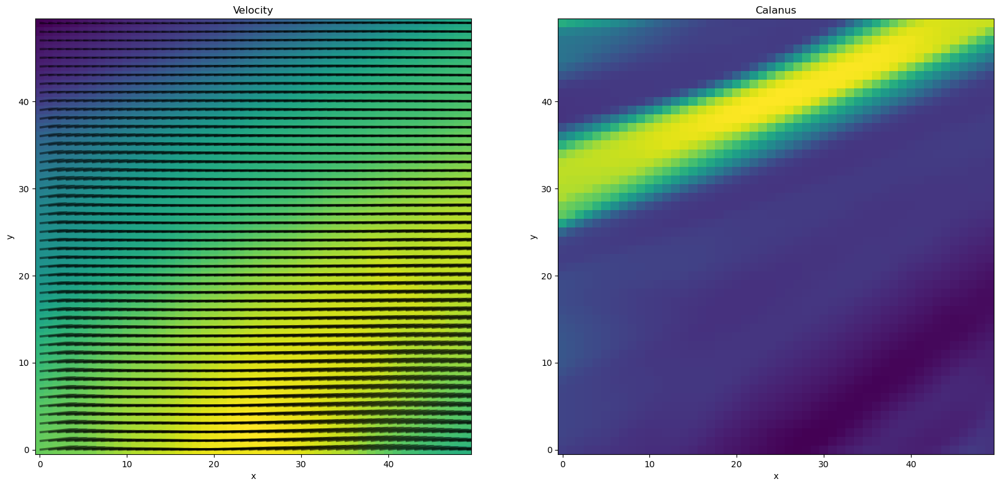

t_ind 20


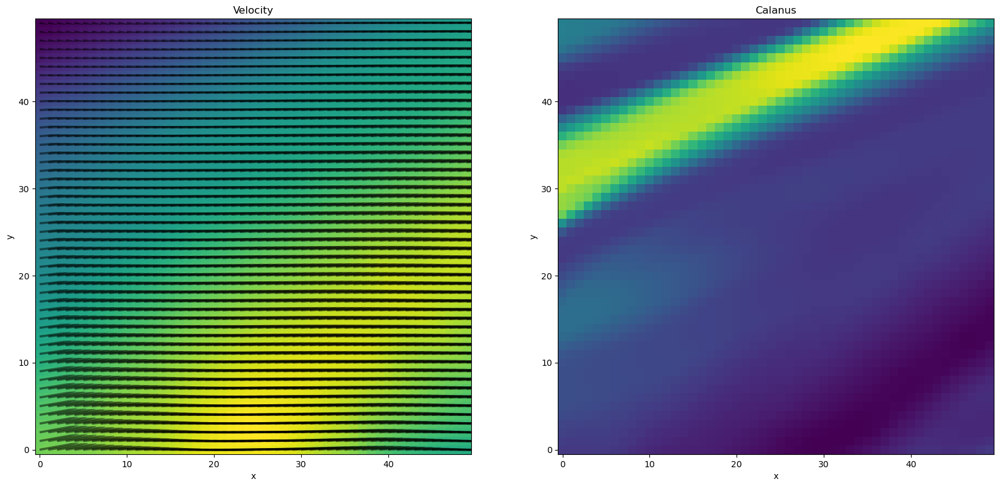

t_ind 25


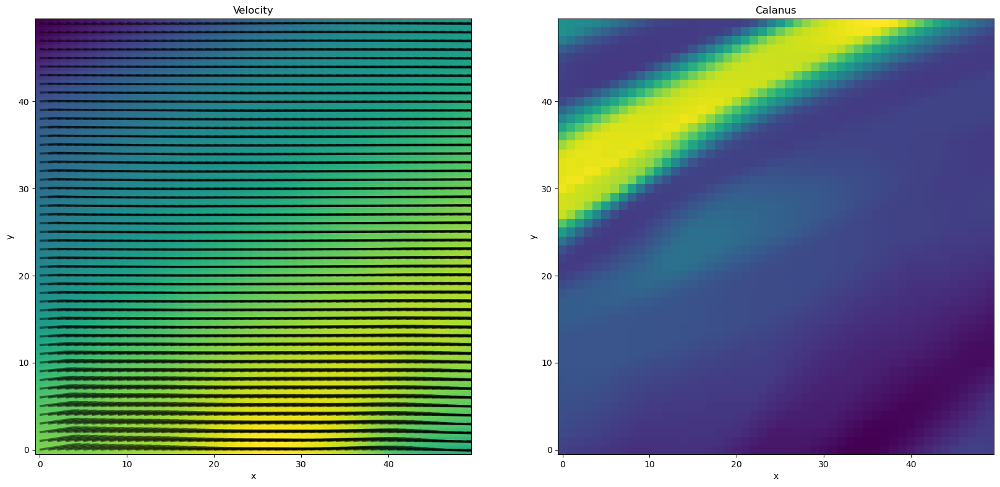

t_ind 30


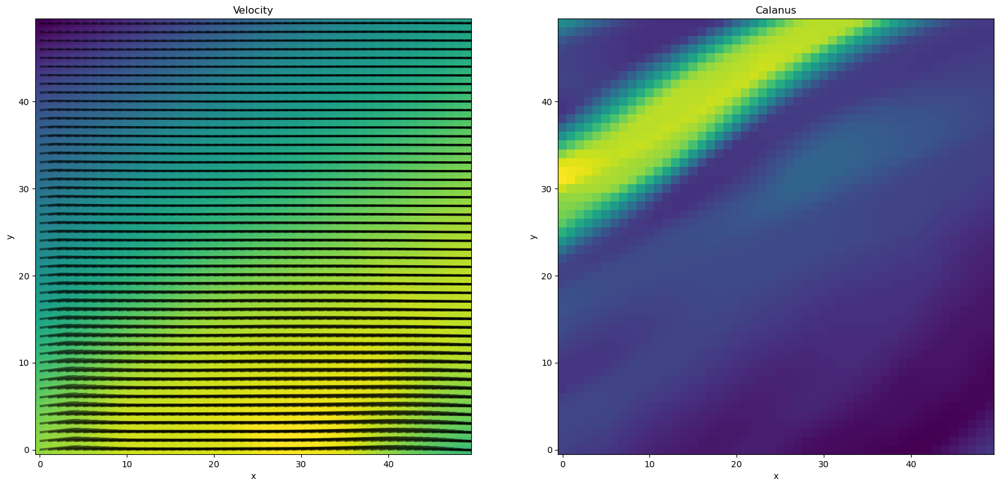

t_ind 35


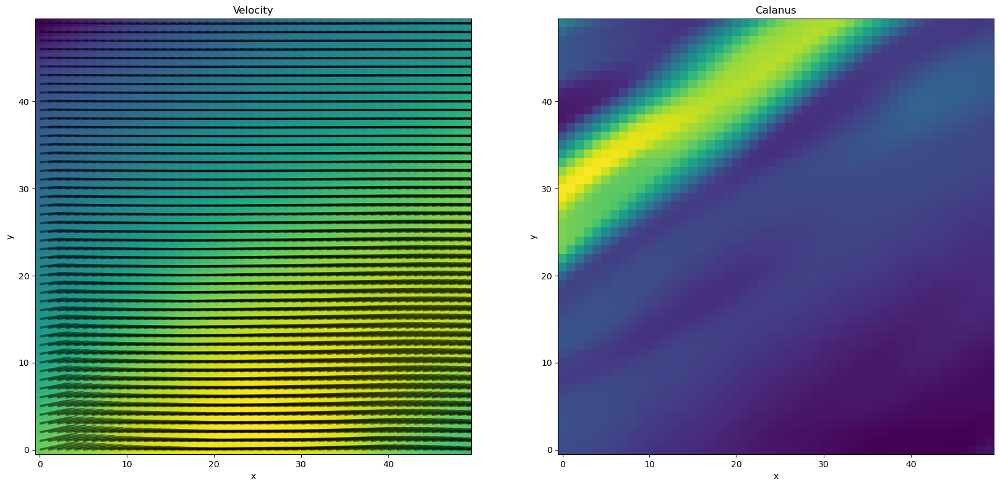

t_ind 40


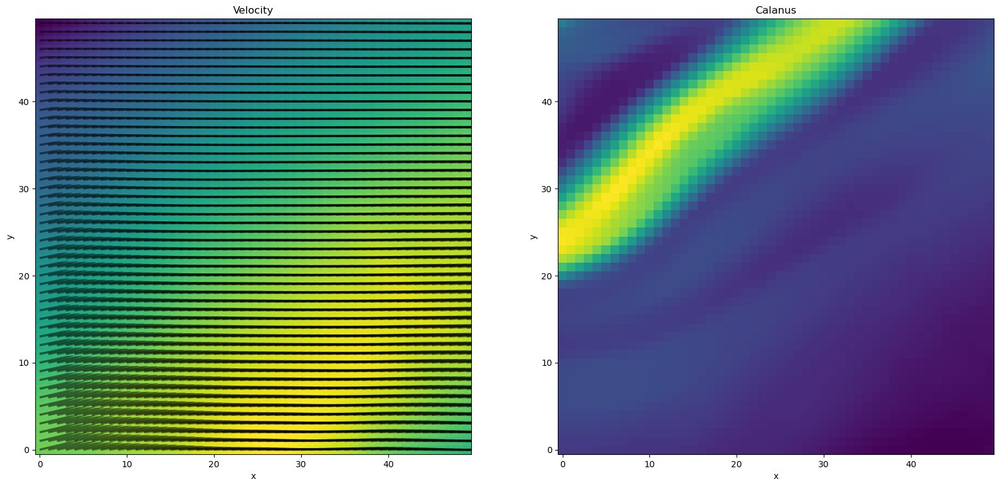

t_ind 45


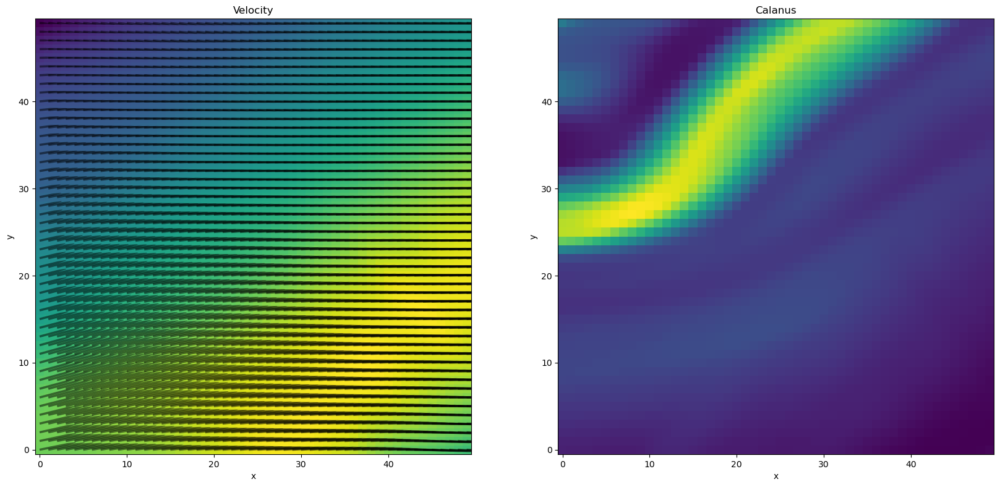

t_ind 50


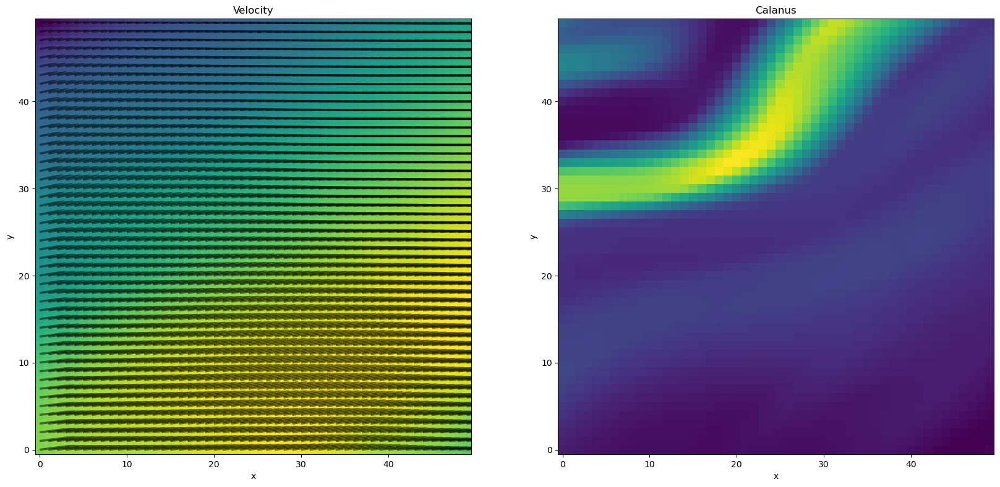

t_ind 55


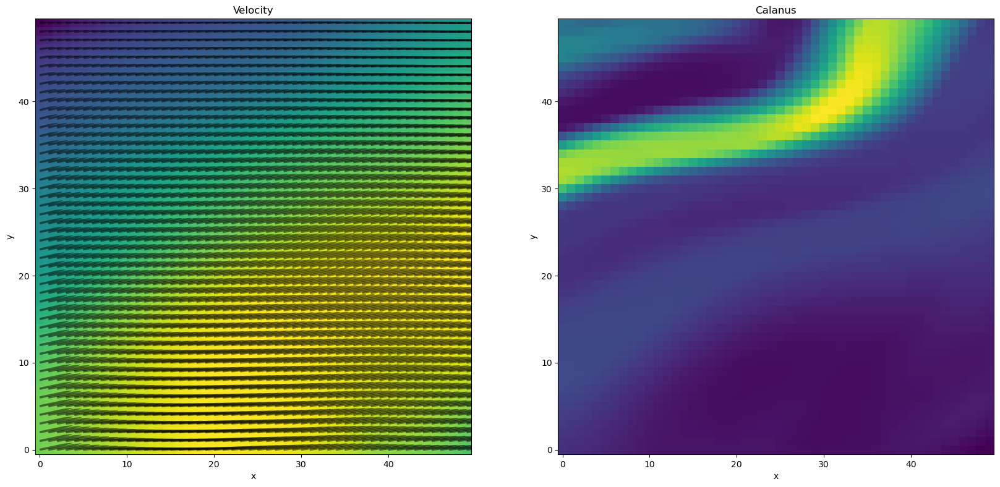

t_ind 60


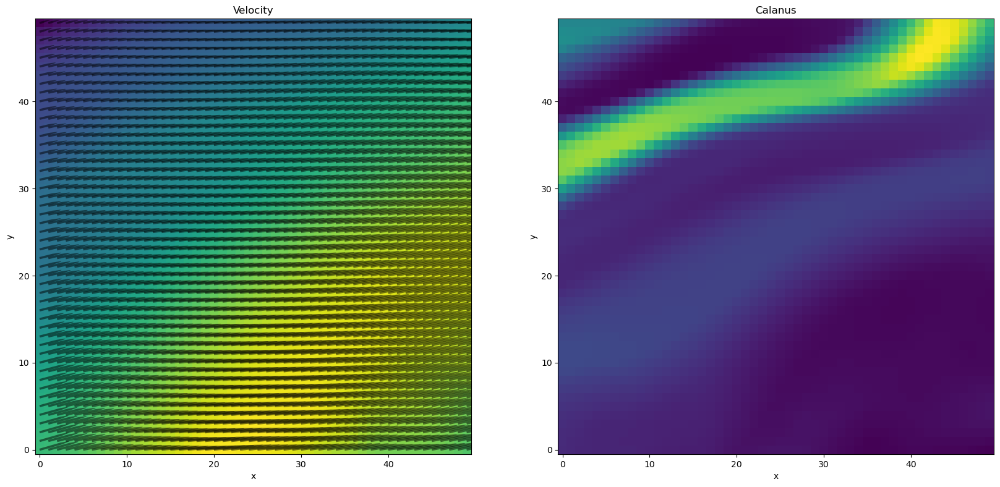

t_ind 65


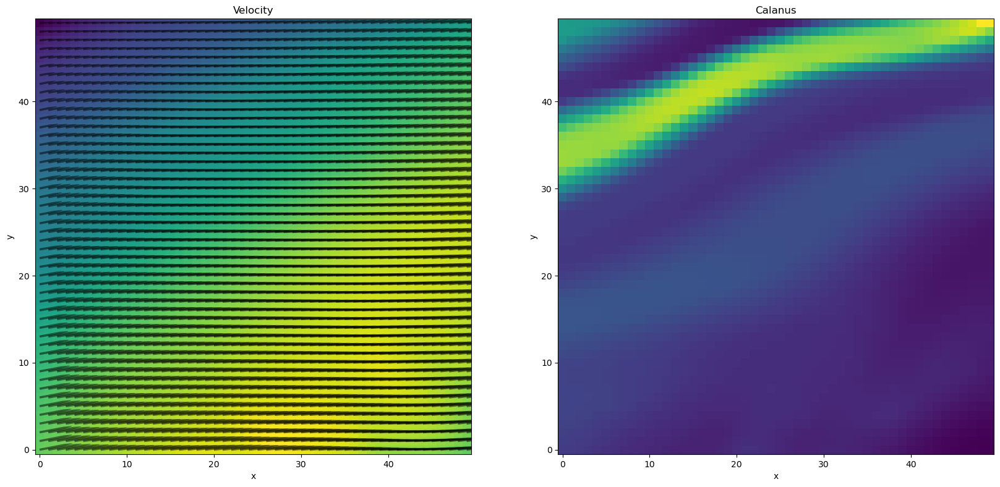

t_ind 70


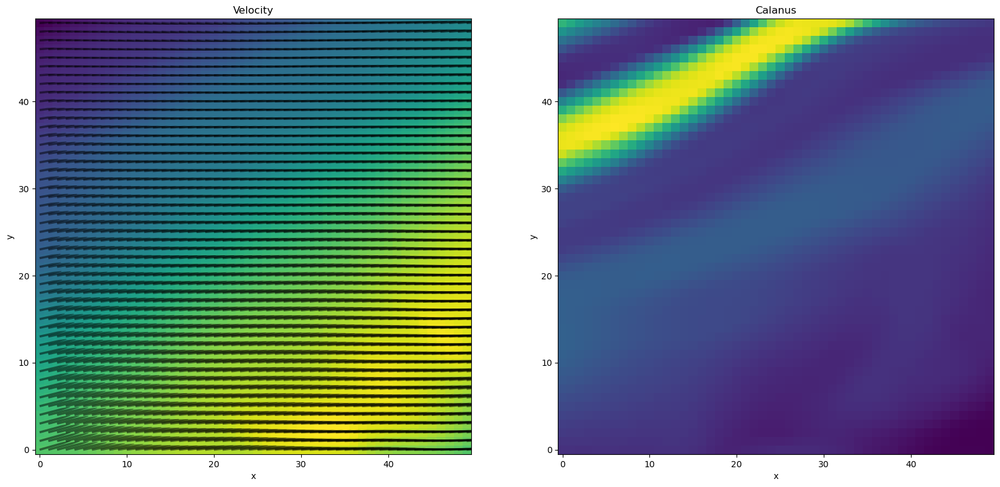

t_ind 75


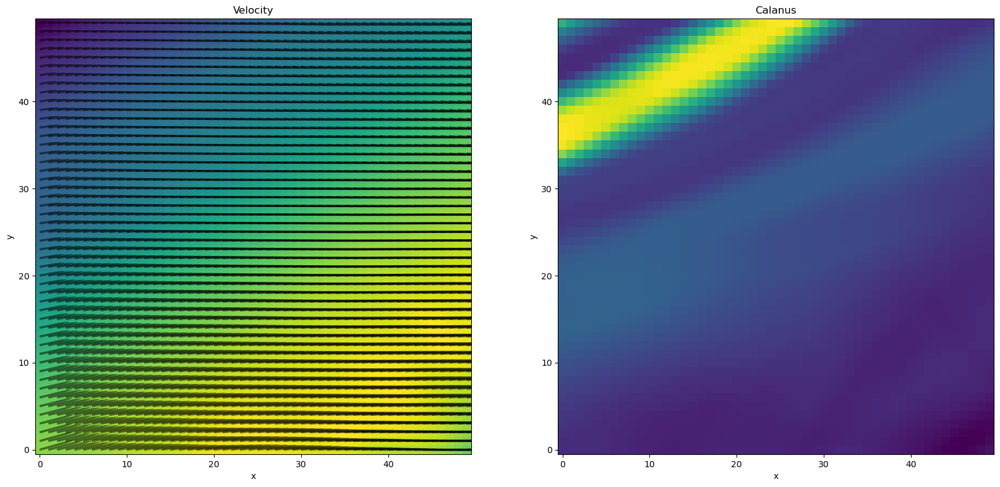

t_ind 80


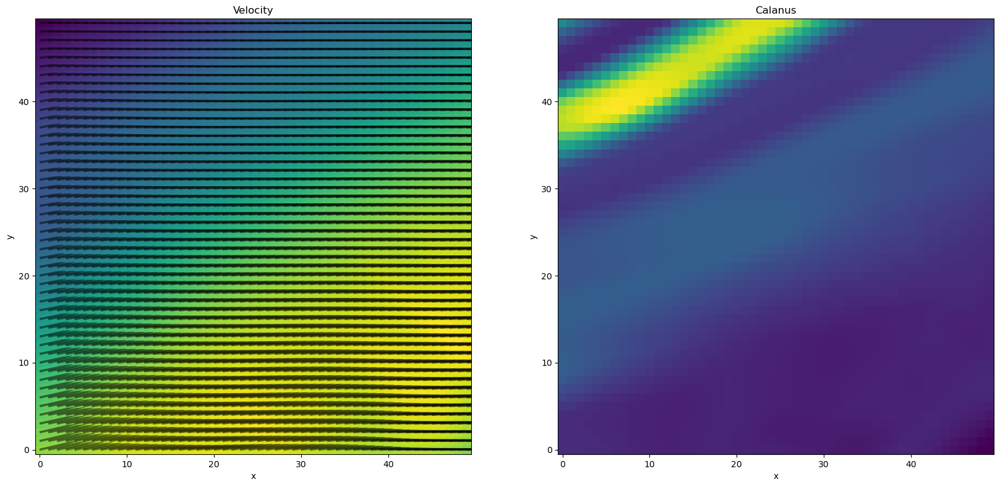

t_ind 85


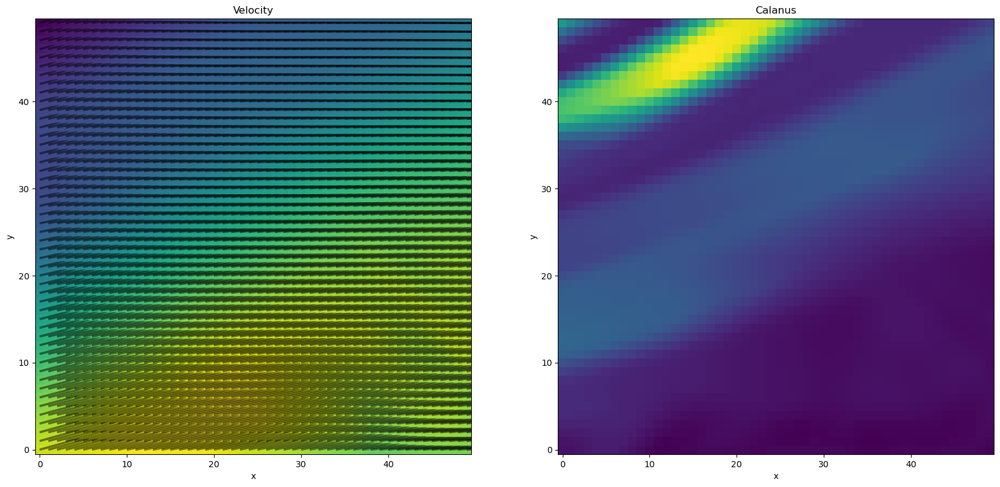

t_ind 90


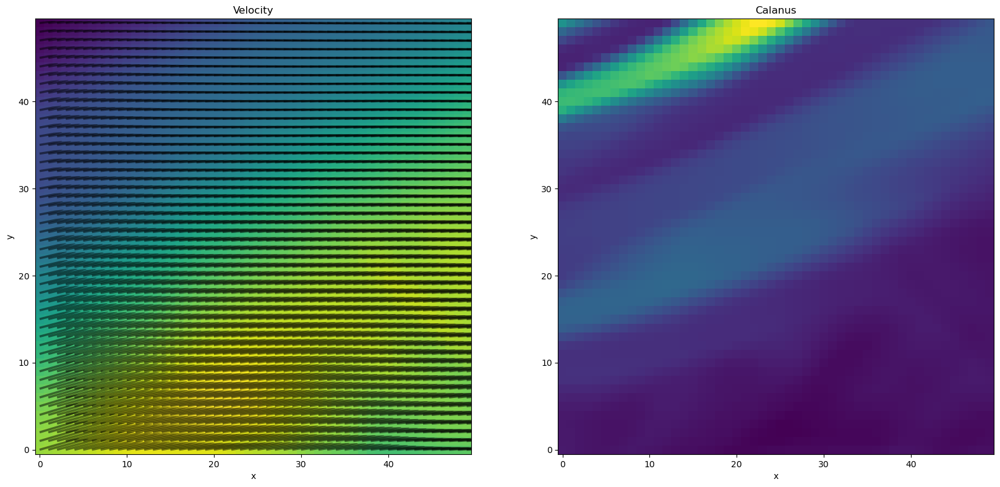

t_ind 95


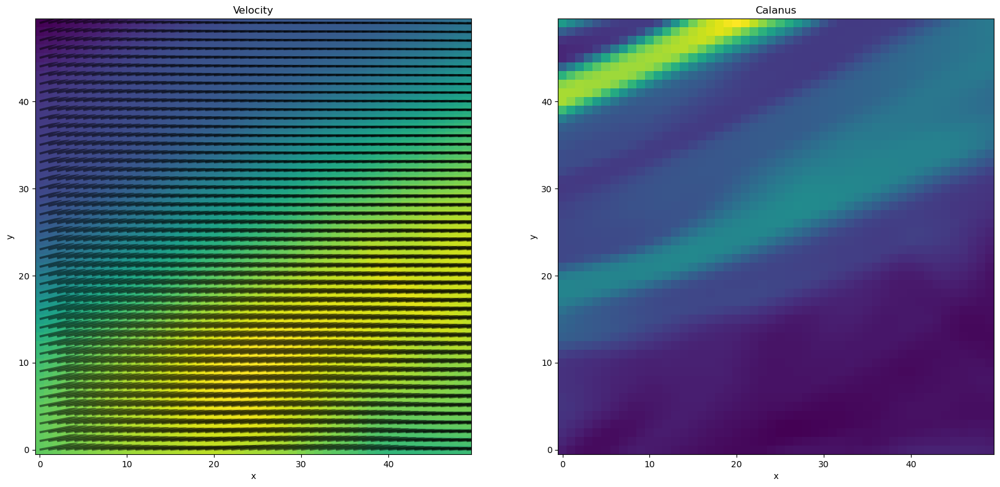

t_ind 100


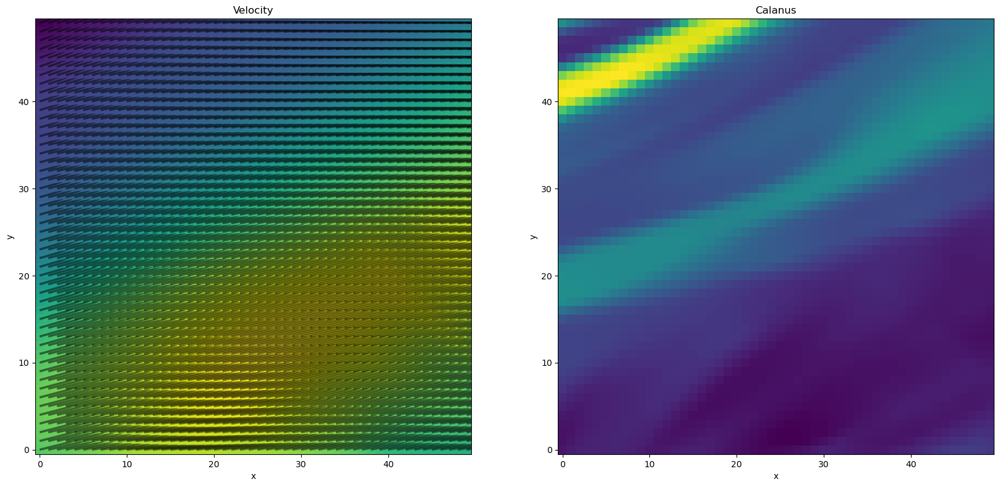

t_ind 105


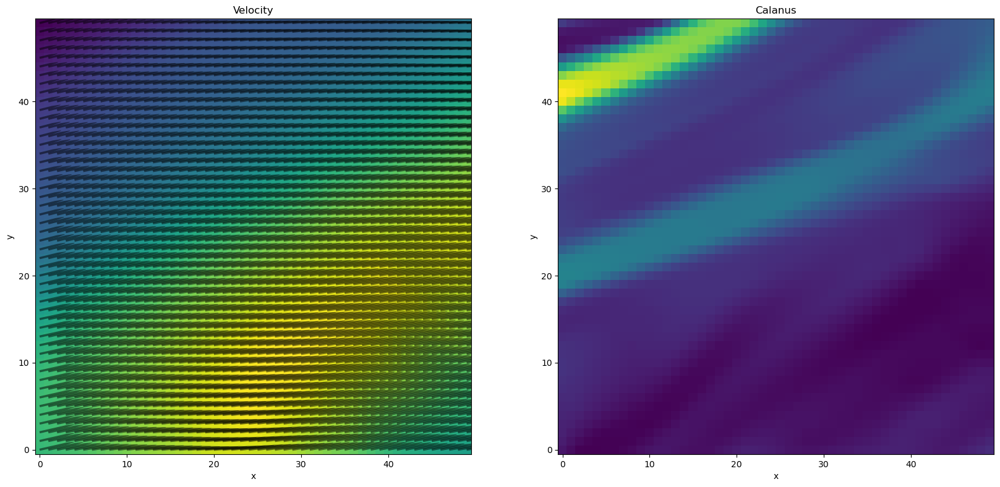

In [10]:

# Plot the data
inds_x = np.arange(400,450)
inds_y = np.arange(300,350)

depth_ind = 3

for t_ind in range(0, 108):
    
    if t_ind % 5 == 0:
        print("t_ind", t_ind)
        u = sinmod_c.sinmod_file.variables["u_east"][t_ind, :, :, :]
        v = sinmod_c.sinmod_file.variables["v_north"][t_ind, :, :, :]
        calanus = sinmod_c.sinmod_file.variables["calanus_finmarchicus"][t_ind, inds_y, inds_x]
        v_d, u_d = u[depth_ind, :, :], v[depth_ind, :, :]
        v_d = v_d[inds_y, :][:, inds_x]
        u_d = u_d[inds_y, :][:, inds_x]
        abs_velocity_d = np.sqrt(u_d**2 + v_d**2)


        fig, ax = plt.subplots(1,2, figsize=(20, 10))
        # Plot the velocity
        ax[0].imshow(abs_velocity_d, origin='lower', cmap=cm.viridis)
        ax[0].set_title("Velocity")
        ax[0].set_xlabel("x")
        ax[0].set_ylabel("y")
        ax[0].quiver(u_d, v_d,
                scale=10, 
                width=0.005,
                headwidth=0.3,
                headlength=0.5,
                headaxislength=4,
                alpha=0.5)
        ax[0].set_title("Velocity")

        ax[1].imshow(calanus, cmap=cm.viridis, origin="lower")
        ax[1].set_title("Calanus")
        ax[1].set_xlabel("x")
        ax[1].set_ylabel("y")
        ax[1].set_title("Calanus")
        plt.show()
    




In [ ]:
# Make a model that takes in u_i, v_i calanus_i and outputs calanus_i+1




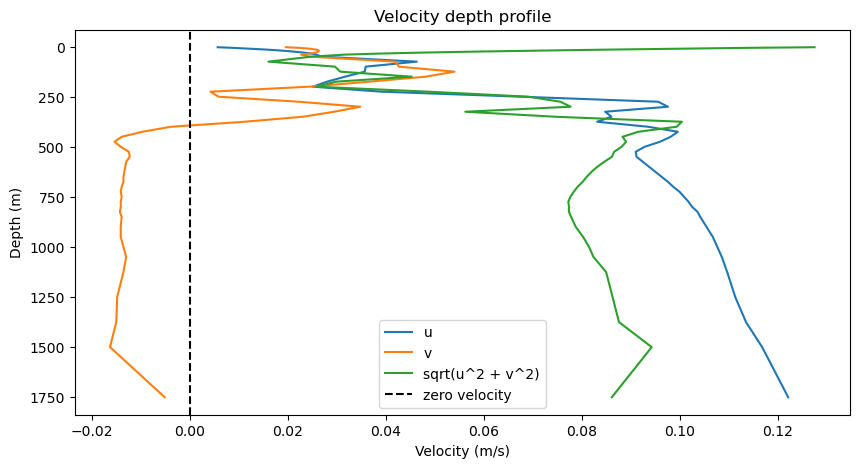

In [11]:
# Plot one velocity depth profile
xc = sinmod_c.sinmod_data["xc"]
yc = sinmod_c.sinmod_data["yc"]
zc = sinmod_c.sinmod_file.variables["zc"][:]
rand_x_ind = np.random.randint(0, len(xc))
rand_y_ind = np.random.randint(0, len(yc))



# Plot one velocity depth profile
fig, ax = plt.subplots(1, 1, figsize=(10, 5))
ax.plot(u[:, rand_y_ind, rand_x_ind], zc, label="u")
ax.plot(v[:, rand_y_ind, rand_x_ind], zc, label="v")
ax.plot(abs_velocity[:, rand_y_ind, rand_x_ind], zc, label="sqrt(u^2 + v^2)")
ax.axvline(x=0, color="k", linestyle="--", label="zero velocity")
ax.legend()
ax.set_title("Velocity depth profile")
ax.set_xlabel("Velocity (m/s)")
ax.set_ylabel("Depth (m)")
# Flip the y-axis to have depth increasing downwards
ax.invert_yaxis()

In [12]:
#Neighbor derivatives for Neumann boundary conditions
def neighborsDerivatives(i,ne,N):
    #(under,left,right,over)
    jumps = np.array((-ne, -1, 1, ne))
    
    #under
    if((i - ne) < 0):
        jumps[0]  = ne
    #over
    if((i + ne) > N-1):
        jumps[3] = -ne
    #left
    if((i % ne) == 0):
        jumps[1] = 1
    #right
    if((i % ne) == ne-1):
        jumps[2] = -1
  
    return(jumps+i)


def findingA(N,ne, ve,vn,D,zeta,dt,dx,dy):
    diag_const = zeta -2*D/(dx**2) -2*D/(dy**2)  # main
    diag_minus_1 = -(-ve/(2*dx))+ D/(dx**2)  #left
    diag_plus_1 = (-ve/(2*dx)) + D/(dx**2)   #right 
    diag_minus_N = -(-vn/(2*dy)) + D/(dy**2) #under 
    diag_plus_N = (-vn/(2*dy)) + D/(dy**2)   #over
    
    A = np.diag(diag_const)
  
    for i in range(N):
        neighbors = neighborsDerivatives(i,ne,N)
        if i < 40:
            print("neighbors", neighbors)
        for j in range(4):
            if(j==0):
                A[i,neighbors[j]] = A[i,neighbors[j]] + diag_minus_N[i]
            if(j==1):
                A[i,neighbors[j]] = A[i,neighbors[j]] + diag_minus_1[i]
            if(j==2):
                A[i,neighbors[j]] = A[i,neighbors[j]] + diag_plus_1[i]
            if(j==3):
                A[i,neighbors[j]] = A[i,neighbors[j]] + diag_plus_N[i]
  
    return (np.diag(np.ones(N)) + dt*A)

def forecasting(A,mean, covariance, epsilon):
    forecasted_mean = np.matmul(A, mean)
    forecasted_covariance = np.matmul(A,np.matmul(covariance, A.transpose())) + epsilon
    return(forecasted_mean, forecasted_covariance)







In [13]:
def check_mask(field, ind, mask_value=0):
    """
    Check if the field is masked at the given index.
    :param field: field to check
    :param ind: index to check
    :return: True if the field is masked at the given index, False otherwise
    """
    if np.ma.is_masked(field[ind]):
        return mask_value
    else:
        return field[ind]


def finding_A(u_east: np.ndarray, 
              v_north: np.ndarray,
              D: float,
              zeta: float,
              dt: float,
              dx: float,
              dy: float,
              grid: Grid,
              make_sparce=False,
              boundary_condition="", 
              debug_print=False) -> np.ndarray:
    """
    Calculate the A matrix, this is a forward propogation matrix.
    :param u: u velocity field to east. Dim [xc, yc]
    :param v: v velocity field to north . Dim [xc, yc]
    :param D: diffusion coefficient 
    :param zeta: damping coefficient
    :param dt: time step
    :param dx: grid spacing in x direction
    :param dy: grid spacing in y direction
    :return: A matrix
    """


    # Calculate the A matrix
    n = len(grid)
    A = np.zeros((n, n))

    u_f, v_f = u_east.flatten(), v_north.flatten()

    diag_const = np.repeat(zeta, n) - 2 * D / dx**2  - 2 * D / dy**2
    A = np.diag(diag_const)

    # Loop over the grid points
    for i in range(n):

        # TODO: It is no
        ind_to_left = grid.get_gi_to_left(i, boundary_condition)
        ind_to_right = grid.get_gi_to_right(i, boundary_condition)
        ind_to_up = grid.get_gi_to_above(i, boundary_condition)
        ind_to_down = grid.get_gi_to_below(i, boundary_condition)   

        if i < 40 and debug_print:
            print(i , "neighbours", ind_to_left, ind_to_right, ind_to_up, ind_to_down)

        # Check if the indices are valid
        if ind_to_left is not None:
            # Check if the elemets are masked
            u_left = check_mask(u_f, ind_to_left)
            A[i, ind_to_left] = A[i, ind_to_left] + u_left / (2 * dx) + D / dx**2
        if ind_to_right is not None:
            u_right = check_mask(u_f, ind_to_right)
            A[i, ind_to_right] = A[i, ind_to_right] -u_right / (2 * dx) + D / dx**2
        if ind_to_up is not None:
            v_up = check_mask(v_f, ind_to_up)
            A[i, ind_to_up] =A[i, ind_to_up]  - v_up / (2 * dy) + D / dy**2
        if ind_to_down is not None:
            v_down = check_mask(v_f, ind_to_down)            
            A[i, ind_to_down] =A[i, ind_to_down] + v_down / (2 * dy) + D / dy**2          

    # Add the diffusion term
    A = A * dt + np.eye(n)

    # Make the matrix sparse if needed
    if make_sparce:
        A = lil_array(A)
        A = A.tocsr()

    return A


def forecasting(A, mean, covariance, epsilon):
    """
    Forecasting step of the Kalman filter.
    :param A: A matrix
    :param mean: mean of the state
    :param covariance: covariance of the state
    :param epsilon: process noise covariance
    :return: forecasted mean and covariance
    """
    
    forecasted_mean = A.dot(mean)
    forecasted_covariance = A.dot(covariance.dot(A.transpose())) + epsilon

    return forecasted_mean, forecasted_covariance

def make_G_matrix(observation_index, n_total_points, make_sparse=True):
    """
    Create the G matrix for the Kalman filter.
    :param observation_index: index of the observation
    :param n_total_points: total number of points in the state
    :param make_sparse: whether to make the matrix sparse or not
    :return: G matrix

    # Can use this, but the functions 
    # G_at_vector(observation_index, vec)
    # G_at_matrix(observation_index, matrix)
    # G_at_matrix_at_G_transpose(observation_index, matrix)
    # are much faster, with n = 10000 the functions are 50x, 600x and 2000x faster respectively
    """
    
    # Create a sparse matrix with zeros and a 1 at the observation index

    G = np.zeros((len(observation_index), n_total_points))
    G[np.arange(len(observation_index)), observation_index] = 1

    if make_sparse:
        G = lil_array(G)
        G = G.tocsr()

    return G


def G_at_vector(observation_index, vec):
    """
    G is a indexing matrix with shape (n_obs, n_total_points) 
    along each row is a vector of zeros with a 1 at the observation index
    
    """
    return vec[observation_index]

def G_at_matrix(observation_index, matrix):
    """
    G is a indexing matrix with shape (n_obs, n_total_points) 
    along each row is a vector of zeros with a 1 at the observation index
    
    """
    return matrix[observation_index,:]

def G_at_matrix_at_G_transpose(observation_index, matrix):
    """
    G is a indexing matrix with shape (n_obs, n_total_points) 
    along each row is a vector of zeros with a 1 at the observation index
    
    """
    return matrix[observation_index,:][:,observation_index]


def kalman_filter(mean, covariance, A, G, observation, observation_index, epsilon, tau):
    """
    Kalman filter implementation.
    :param mean: mean of the state
    :param covariance: covariance of the state
    :param A: A matrix
    :param G: G matrix
    :param observation: observation
    :param epsilon: process noise covariance
    :param tau: observation noise covariance
    :return: updated mean and covariance
    """
    
    # Forecast step
    forecasted_mean, forecasted_covariance = forecasting(A, mean, covariance, epsilon)

    # Update step
    K = np.matmul(forecasted_covariance, np.linalg.inv(forecasted_covariance + tau**2))
    updated_mean = forecasted_mean + np.matmul(K, (observation - G_at_vector(observation_index, forecasted_mean)))
    updated_covariance = forecasted_covariance - np.matmul(K, np.matmul(tau, K.transpose()))

    return updated_mean, updated_covariance


def Q_matrix(R, Omega, observation_index):

    """
    Create the Q matrix for the Kalman filter.
    :param R: process noise covariance
    :param Omega: observation noise covariance
    :param observation_index: index of the observation
    :return: Q matrix
    """
    # 
    G_at_R_at_G = G_at_matrix_at_G_transpose(observation_index, R)

    # Create the Q matrix
    return G_at_R_at_G + Omega

def kalman_gain(covariance, H, R):
    pass

(15, 20) (15, 20)
neighbors [15  1  1 15]
neighbors [16  0  2 16]
neighbors [17  1  3 17]
neighbors [18  2  4 18]
neighbors [19  3  5 19]
neighbors [20  4  6 20]
neighbors [21  5  7 21]
neighbors [22  6  8 22]
neighbors [23  7  9 23]
neighbors [24  8 10 24]
neighbors [25  9 11 25]
neighbors [26 10 12 26]
neighbors [27 11 13 27]
neighbors [28 12 14 28]
neighbors [29 13 13 29]
neighbors [ 0 16 16 30]
neighbors [ 1 15 17 31]
neighbors [ 2 16 18 32]
neighbors [ 3 17 19 33]
neighbors [ 4 18 20 34]
neighbors [ 5 19 21 35]
neighbors [ 6 20 22 36]
neighbors [ 7 21 23 37]
neighbors [ 8 22 24 38]
neighbors [ 9 23 25 39]
neighbors [10 24 26 40]
neighbors [11 25 27 41]
neighbors [12 26 28 42]
neighbors [13 27 29 43]
neighbors [14 28 28 44]
neighbors [15 31 31 45]
neighbors [16 30 32 46]
neighbors [17 31 33 47]
neighbors [18 32 34 48]
neighbors [19 33 35 49]
neighbors [20 34 36 50]
neighbors [21 35 37 51]
neighbors [22 36 38 52]
neighbors [23 37 39 53]
neighbors [24 38 40 54]


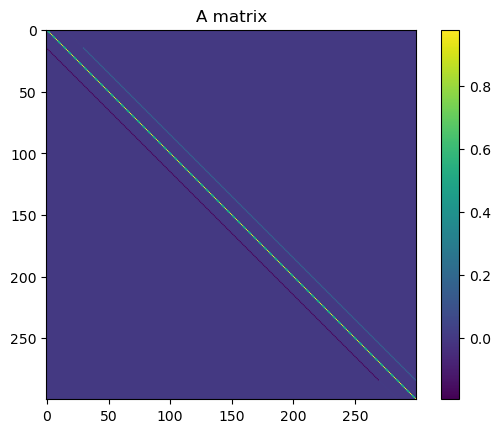

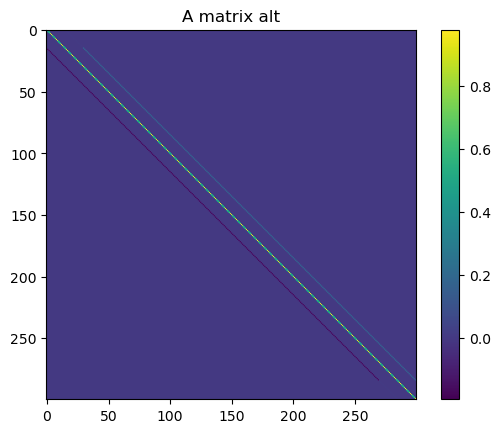

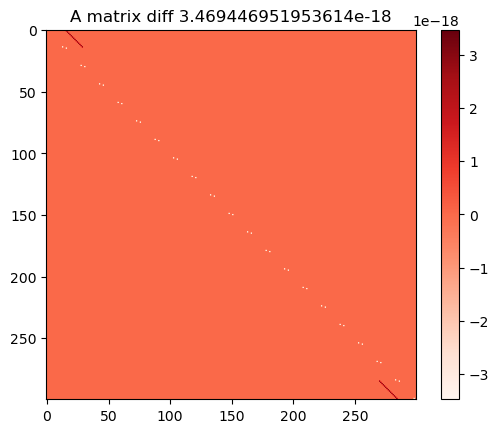

In [14]:
inds_x = np.arange(400,420)
inds_y = np.arange(300,315)
depth_ind = 3
u = sinmod_c.sinmod_file.variables["u_east"][0, depth_ind, inds_y, inds_x]
v = sinmod_c.sinmod_file.variables["v_north"][0, depth_ind, inds_y, inds_x]
grid = Grid()
grid.make_regular_grid_from_axes(yc[inds_y], xc[inds_x])


ve = np.repeat(0.2, len(u.flatten()))
vn = np.repeat(-1, len(v.flatten()))

print(u.shape, v.shape) 
D = 0.1
zeta = -0.001
dt = 4
dx = 10
dy = 10
N = len(u.flatten())

ne = u.shape[0]

A = findingA(N, ne, ve, vn, D, np.repeat(zeta,N), dt, dx, dy)
A_alt = finding_A(ve, vn, D, zeta, dt, dx, dy, grid, boundary_condition="reflective")   


vmin = np.min((A, A_alt))
vmax = np.max((A, A_alt))
plt.imshow(A, cmap=cm.viridis, vmin=vmin, vmax=vmax)
plt.colorbar()
plt.title("A matrix")
plt.show()
plt.imshow(A_alt, cmap=cm.viridis, vmin=vmin, vmax=vmax)
plt.colorbar()
plt.title("A matrix alt")
plt.show()
plt.imshow((A-A_alt), cmap=cm.Reds)
plt.colorbar()
plt.title(f"A matrix diff {np.max(A-A_alt)}")
plt.show()

In [16]:
def add_cbar(fig, ax, vmin=0, vmax=1, cmap=cm.viridis, label=""):
    norm = mpl.colors.Normalize(vmin=vmin, vmax=vmax)
    cbo = plt.colorbar(mpl.cm.ScalarMappable(norm=norm, cmap=cm.viridis), ax=ax)
    cbo.set_label(label)

dx, dy, dt 800.0 800.0 3600.0
2500
calanus_t0.shape (50, 50)
calanus_t0.shape (2500,)
u.shape, v.shape (50, 50) (50, 50)
abs_velocity.shape (50, 50)
calanus.shape (108, 50, 50)
calanus_t0.shape (2500,)
u.shape, v.shape (50, 50) (50, 50)
abs_velocity.shape (50, 50)


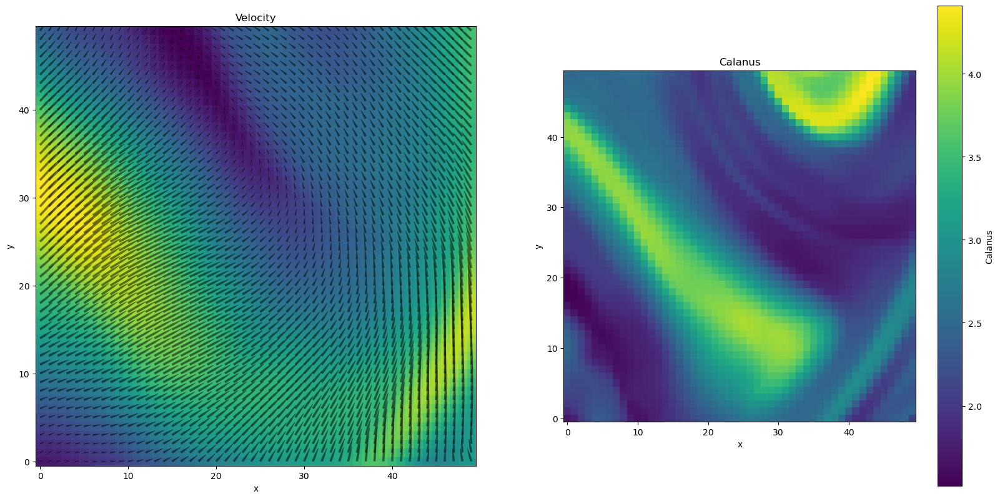

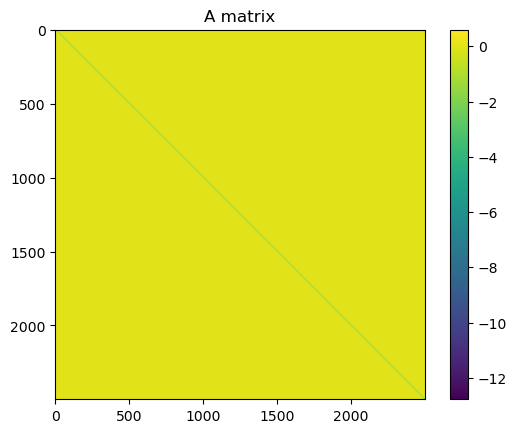

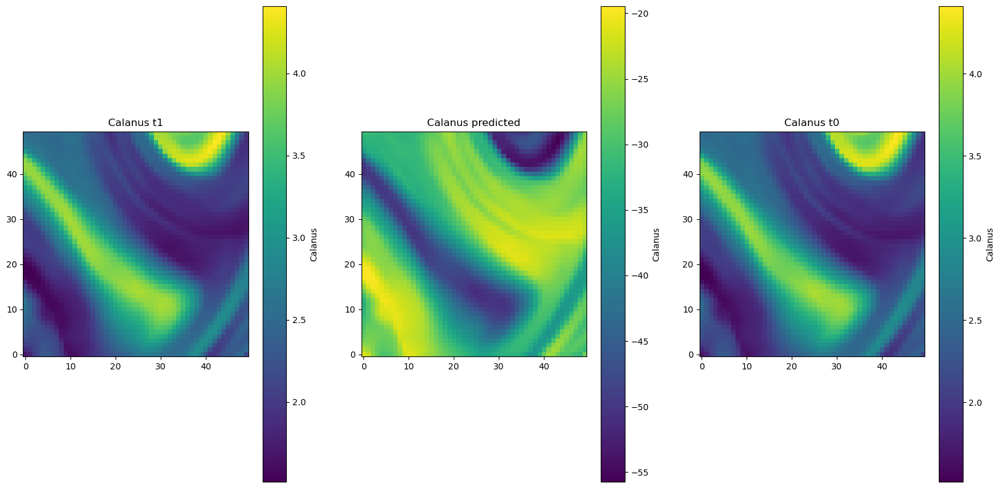

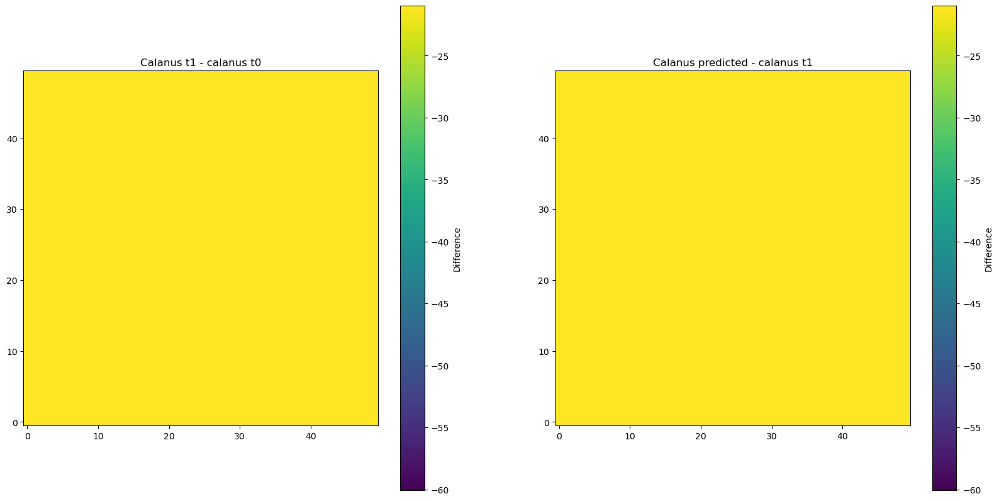

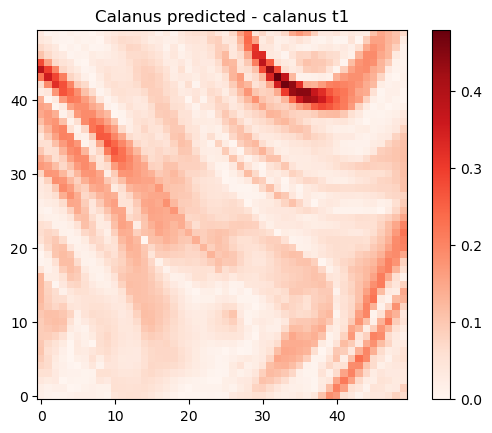

In [45]:
x_inds = np.arange(400,450)
y_inds = np.arange(400,450)
calanus = sinmod_c.sinmod_file.variables["calanus_finmarchicus"][:, x_inds, y_inds]

grid = Grid()
grid.make_regular_grid_from_axes(yc[y_inds], xc[x_inds])
dx = xc[1] - xc[0]
dy = yc[1] - yc[0]
dt = time_step_s[1] - time_step_s[0]
print("dx, dy, dt", dx, dy, dt)

print(len(grid))

t_ind = 10
depth_ind =  8
zeta= -0.0037926902
D= 5.4555947812
u = sinmod_c.sinmod_file.variables["u_east"][t_ind, depth_ind, y_inds, x_inds]
v = sinmod_c.sinmod_file.variables["v_north"][t_ind, depth_ind, y_inds, x_inds]
abs_velocity = np.sqrt(u**2 + v**2)

v_min, v_max = np.min(calanus), np.max(calanus)

calanus_t0 = sinmod_c.sinmod_file.variables["calanus_finmarchicus"][t_ind, y_inds, x_inds]
print("calanus_t0.shape", calanus_t0.shape)
calanus_t0 = calanus_t0.flatten()
calanus_t0_reshape = calanus_t0.reshape(len(y_inds), len(x_inds))

print("calanus_t0.shape", calanus_t0.shape)
print("u.shape, v.shape", u.shape, v.shape)
print("abs_velocity.shape", abs_velocity.shape)
print("calanus.shape", calanus.shape)
print("calanus_t0.shape", calanus_t0.shape)
A = finding_A(u,v, D=D, zeta=zeta, dt=dt, dx=dx, dy=dy, grid=grid)
calanus_pred_t1 = A @ calanus_t0

calanus_t1 = sinmod_c.sinmod_file.variables["calanus_finmarchicus"][t_ind+1, y_inds, x_inds]





print("u.shape, v.shape", u.shape, v.shape)

fig, ax = plt.subplots(1, 2, figsize=(20, 10))

print("abs_velocity.shape", abs_velocity.shape)
ax[0].imshow(abs_velocity[:, :], origin='lower', cmap=cm.viridis)
ax[0].set_title("Velocity")
ax[0].set_xlabel("x")
ax[0].set_ylabel("y")
ax[0].quiver(u[:,:], v[:,:],
        scale=5, 
        width=0.005,
        headwidth=0.3,
        headlength=0.5,
        headaxislength=4,
        alpha=0.5)
ax[0].set_title("Velocity")

ax[1].imshow(calanus_t0_reshape, cmap=cm.viridis, origin="lower")
norm = mpl.colors.Normalize(vmin=np.min(calanus[t_ind]), vmax=np.max(calanus[t_ind]))
cbo = plt.colorbar(mpl.cm.ScalarMappable(norm=norm, cmap=cm.viridis), ax=ax[1])
cbo.set_label("Calanus")
ax[1].set_title("Calanus")
ax[1].set_xlabel("x")
ax[1].set_ylabel("y")
ax[1].set_title("Calanus")
plt.show()




plt.imshow(A, cmap=cm.viridis)
plt.colorbar()
plt.title("A matrix")
plt.show()


calanus_t1_reshape = calanus_t1.reshape(len(y_inds), len(x_inds))
calanus_t0_reshape = calanus_t0.reshape(len(y_inds), len(x_inds))
calanus_pred_t1_reshape = calanus_pred_t1.reshape(len(y_inds), len(x_inds))
diff_t0_t1 = np.abs(calanus_t1_reshape - calanus_t0_reshape)
diff_pred_t1 = np.abs(calanus_pred_t1_reshape - calanus_t1_reshape)
fig, ax = plt.subplots(1, 3, figsize=(20, 10))
ax[0].imshow(calanus_t1.reshape(len(y_inds), len(x_inds)), cmap=cm.viridis, origin="lower")
norm = mpl.colors.Normalize(vmin=np.min(calanus_t1), vmax=np.max(calanus_t1))
cbo = plt.colorbar(mpl.cm.ScalarMappable(norm=norm, cmap=cm.viridis), ax=ax[0])
cbo.set_label("Calanus")
ax[0].set_title("Calanus t1")
ax[1].imshow(calanus_pred_t1.reshape(len(y_inds), len(x_inds)), cmap=cm.viridis, origin="lower")
norm = mpl.colors.Normalize(vmin=np.min(calanus_pred_t1), vmax=np.max(calanus_pred_t1))
cbo = plt.colorbar(mpl.cm.ScalarMappable(norm=norm, cmap=cm.viridis), ax=ax[1])
cbo.set_label("Calanus")
ax[1].set_title("Calanus predicted")
ax[2].imshow(calanus_t0.reshape(len(y_inds), len(x_inds)), cmap=cm.viridis, origin="lower")
norm = mpl.colors.Normalize(vmin=np.min(calanus_t0), vmax=np.max(calanus_t0))
cbo = plt.colorbar(mpl.cm.ScalarMappable(norm=norm, cmap=cm.viridis), ax=ax[2])
cbo.set_label("Calanus")
ax[2].set_title("Calanus t0")
plt.show()

fig, ax = plt.subplots(1, 2, figsize=(20, 10))

diff = np.abs(calanus_t1_reshape - calanus_t0_reshape)
diff_min = np.min(diff)
diff_max = np.max(diff)
diff_n = calanus_pred_t1_reshape - calanus_t1_reshape
diff_n_min = np.min(diff_n)
diff_n_max = np.max(diff_n)

ax[0].imshow(np.abs(calanus_t0_reshape - calanus_t1_reshape), cmap=cm.viridis, origin="lower" , vmin=diff_n_min, vmax=diff_n_max)
add_cbar(fig, ax[0], vmin=diff_n_min, vmax=diff_n_max, label="Difference")

ax[0].set_title(f"Calanus t1 - calanus t0")
ax[0].set_title("Calanus t1 - calanus t0")
ax[1].imshow(np.abs(calanus_pred_t1_reshape - calanus_t1_reshape), cmap=cm.viridis, origin="lower" , vmin=diff_n_min, vmax=diff_n_max)
add_cbar(fig, ax[1], vmin=diff_n_min, vmax=diff_n_max, label="Difference")
ax[1].set_title("Calanus predicted - calanus t1")
plt.show()

plt.imshow(diff, cmap=cm.Reds, origin="lower")
plt.colorbar()
plt.title("Calanus predicted - calanus t1")
plt.show()

In [41]:
print("dx, dy, dz, dt", dx, dy, dz, dt)


dx, dy, dz, dt 800.0 800.0 3.0 3600.0


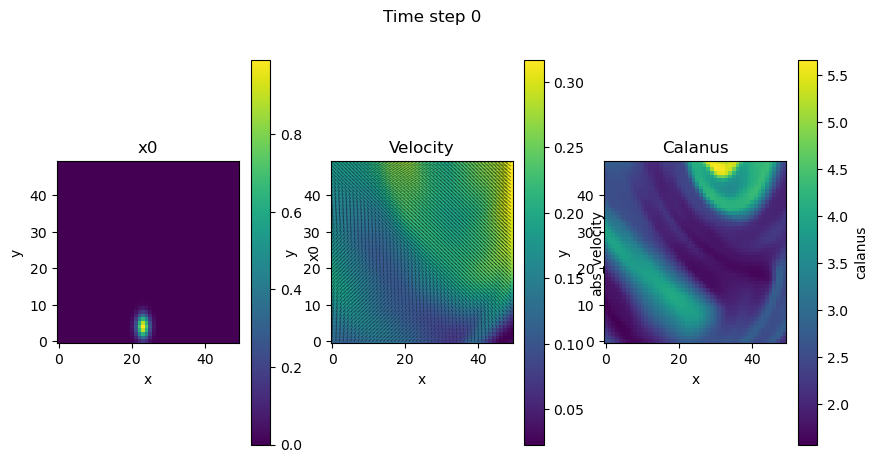

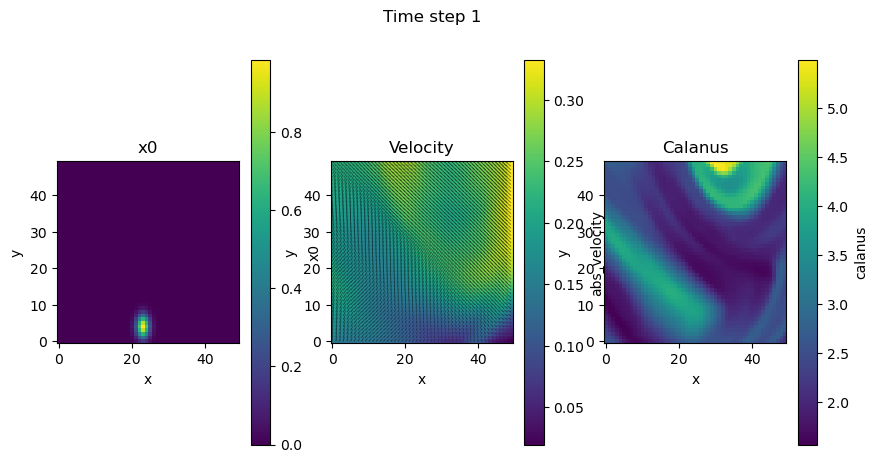

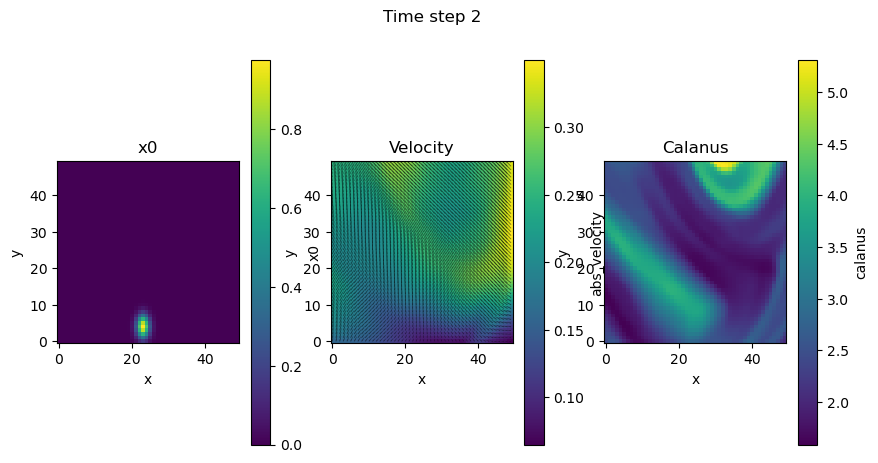

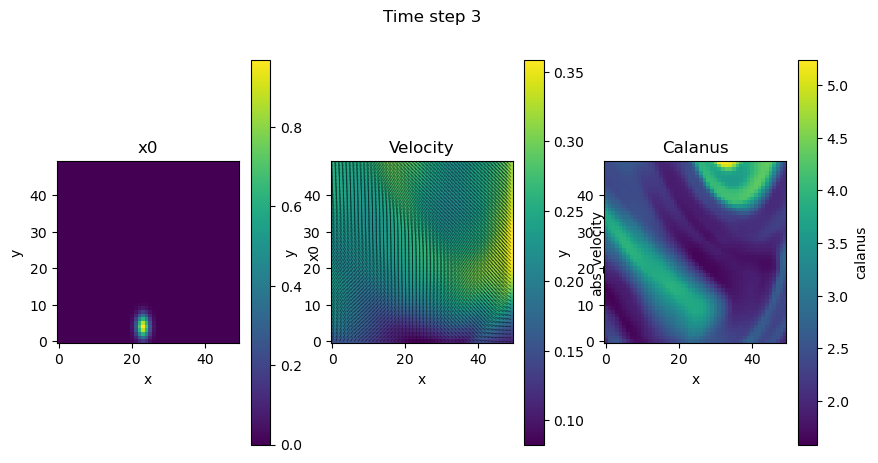

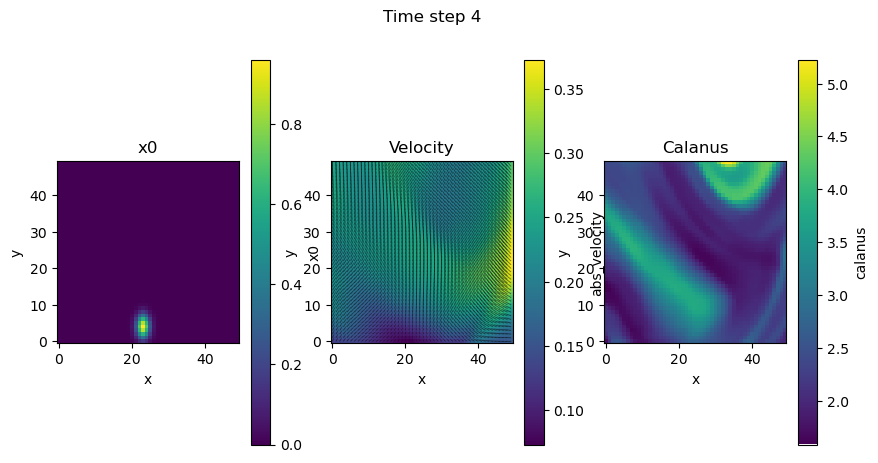

...

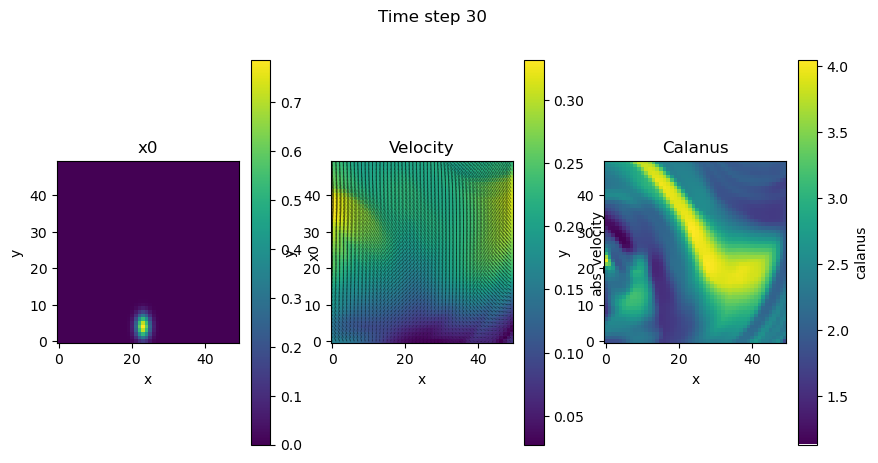

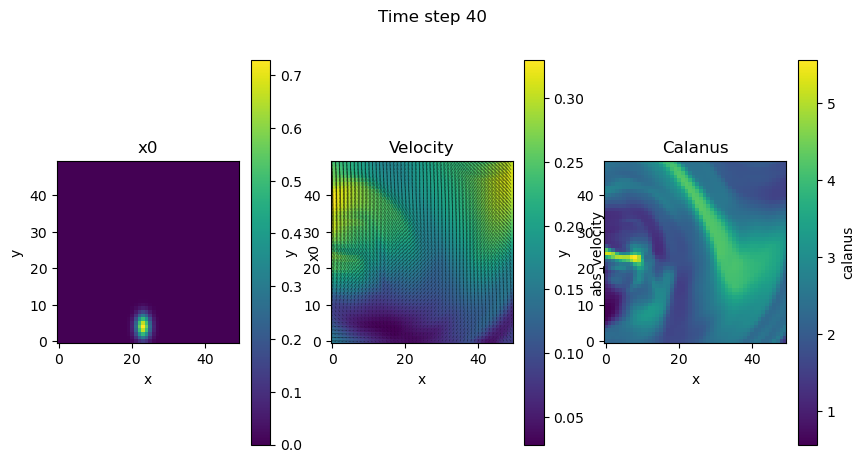

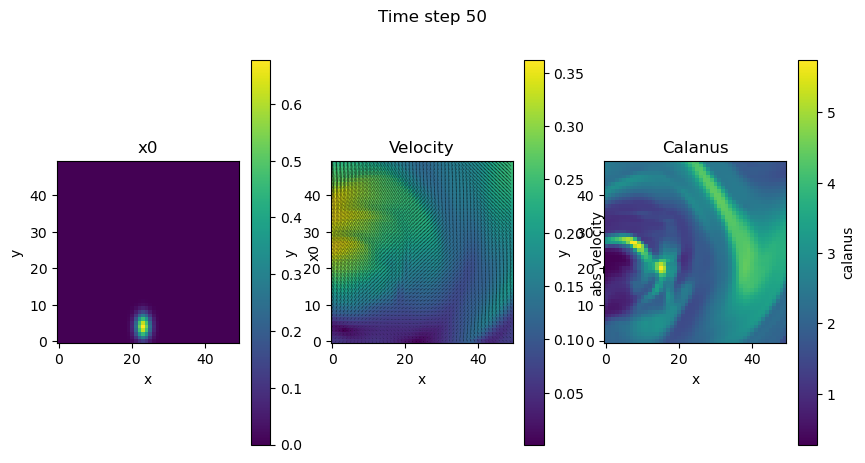

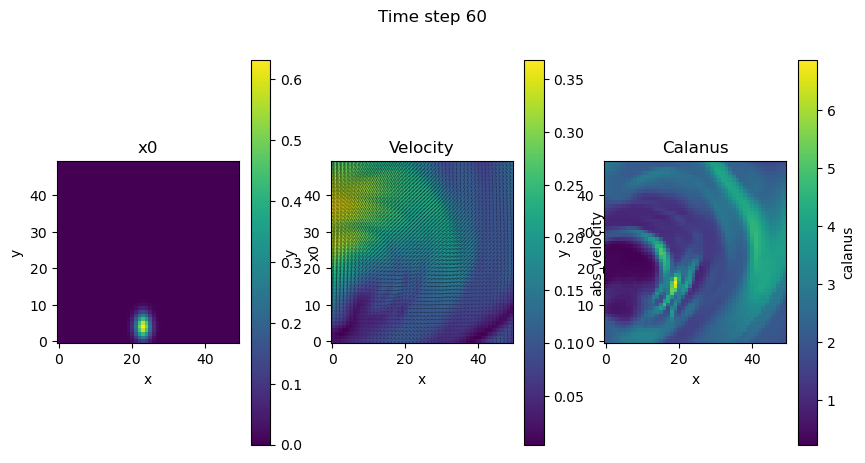

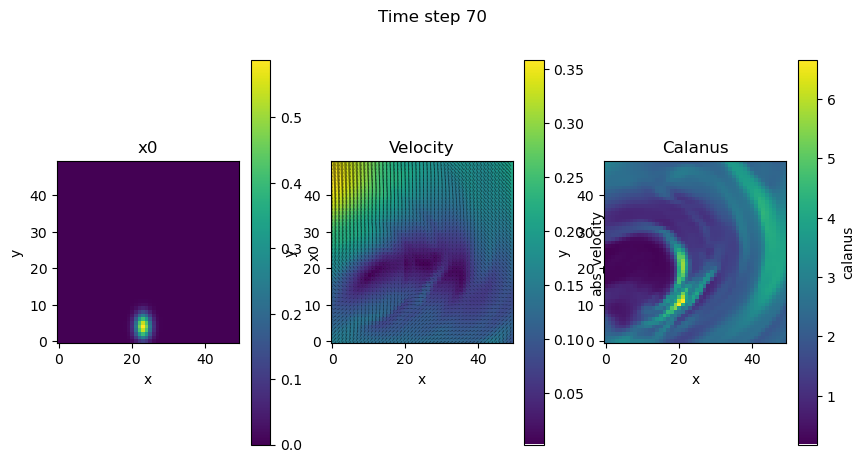

In [ ]:
x_inds = np.arange(400,450)
y_inds = np.arange(400,450)
depth_ind = 3
x0 = np.zeros((len(y_inds), len(x_inds)))
calanus = sinmod_c.sinmod_file.variables["calanus_finmarchicus"][:, x_inds, y_inds]

x_origin = np.random.randint(0+4, len(y_inds)-4)
y_origin = np.random.randint(0+4, len(x_inds)-4)

func = lambda x,y: np.exp(-((x-x_origin)**2/3 + (y-y_origin)**2)/3)
for i in range(len(y_inds)):
    for j in range(len(x_inds)):
        x0[i,j] = func(i,j) #+ np.random.uniform(0.1,0.3)
x0_f = x0.flatten()
#x0_f = calanus[0, : , :].flatten()

abs_velocity = np.sqrt(u**2 + v**2)

for i in range(0, 108):
    u = sinmod_c.sinmod_file.variables["u_east"][i, depth_ind, y_inds, x_inds]
    v = sinmod_c.sinmod_file.variables["v_north"][i, depth_ind, y_inds, x_inds]
    abs_velocity = np.sqrt(u**2 + v**2)
    A = finding_A(u/10,v/10, D=1, zeta=-0.000001, dt=dt, dx=dx, dy=dy, grid=grid, make_sparce=True)
    x0_f = A.dot(x0_f)
    x0 = x0_f.reshape(len(y_inds), len(x_inds))
    if i % 10 == 0 or i < 10:
        fig, ax = plt.subplots(1, 3, figsize=(10, 5))

        ax[0].imshow(x0, cmap=cm.viridis, origin="lower")
        add_cbar(fig, ax[0], vmin=np.min(x0), vmax=np.max(x0), label="x0")
        ax[0].set_title(f"x0 at time {i}")
        ax[0].set_title("x0")
        ax[0].set_xlabel("x")
        ax[0].set_ylabel("y")
        ax[1].imshow(abs_velocity, cmap=cm.viridis, origin="lower")
        add_cbar(fig, ax[1], vmin=np.min(abs_velocity), vmax=np.max(abs_velocity), label="abs_velocity")
        ax[1].quiver(u[:,:], v[:,:],
                scale=5, 
                width=0.005,
                headwidth=0.3,
                headlength=0.5,
                headaxislength=4,
                alpha=0.5)
        ax[1].set_title("Velocity")
        ax[1].set_xlabel("x")
        ax[1].set_ylabel("y")
        ax[1].set_title("Velocity")

        ax[2].imshow(calanus[i, :,:], cmap=cm.viridis, origin="lower")
        add_cbar(fig, ax[2], vmin=np.min(calanus[i, :,:]), vmax=np.max(calanus[i, :,:]), label="calanus")
        ax[2].set_title("Calanus")
        ax[2].set_xlabel("x")
        ax[2].set_ylabel("y")
        ax[2].set_title("Calanus")
    
        fig.suptitle(f"Time step {i}")
        plt.show()


In [ ]:
print("dx, dy, dz, dt", dx, dy, dz, dt)

dx, dy, dz, dt 10 10 3.0 4


u_int.shape, v_int.shape (50, 50) (50, 50)


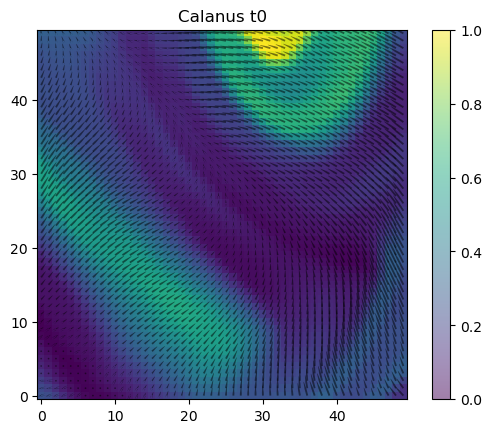

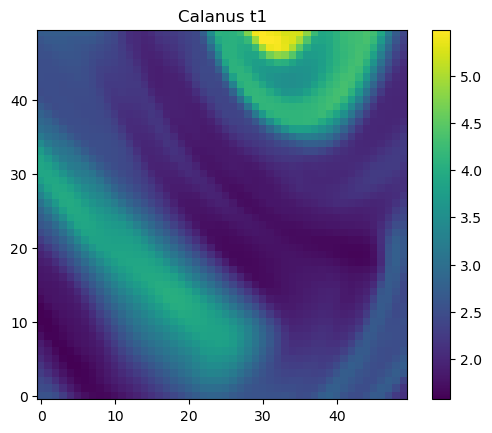

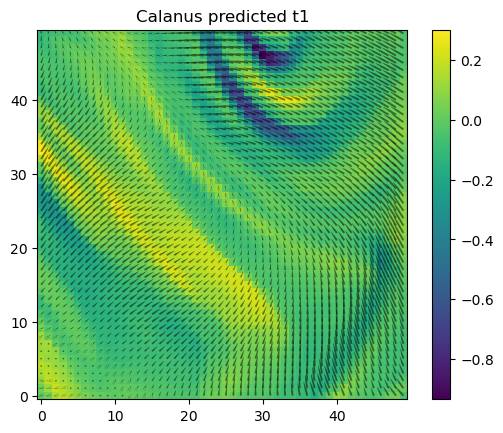

zeta: -0.000100, D: 100.000, mse:0.863
zeta: -0.000100, D: 35.938, mse:0.849
zeta: -0.000100, D: 12.915, mse:0.846
zeta: -0.000100, D: 4.642, mse:0.844
zeta: -0.000100, D: 1.668, mse:0.844
zeta: -0.000100, D: 0.599, mse:0.844
zeta: -0.000100, D: 0.215, mse:0.844
zeta: -0.000100, D: 0.077, mse:0.844
zeta: -0.000100, D: 0.028, mse:0.844
zeta: -0.000100, D: 0.010, mse:0.844
zeta: -0.000022, D: 100.000, mse:0.059
zeta: -0.000022, D: 35.938, mse:0.054
zeta: -0.000022, D: 12.915, mse:0.054
zeta: -0.000022, D: 4.642, mse:0.054
zeta: -0.000022, D: 1.668, mse:0.054
zeta: -0.000022, D: 0.599, mse:0.054
zeta: -0.000022, D: 0.215, mse:0.054
zeta: -0.000022, D: 0.077, mse:0.054
zeta: -0.000022, D: 0.028, mse:0.054
zeta: -0.000022, D: 0.010, mse:0.054
zeta: -0.000005, D: 100.000, mse:0.041
zeta: -0.000005, D: 35.938, mse:0.038
zeta: -0.000005, D: 12.915, mse:0.038
zeta: -0.000005, D: 4.642, mse:0.039
zeta: -0.000005, D: 1.668, mse:0.039
zeta: -0.000005, D: 0.599, mse:0.039
zeta: -0.000005, D: 0.215,

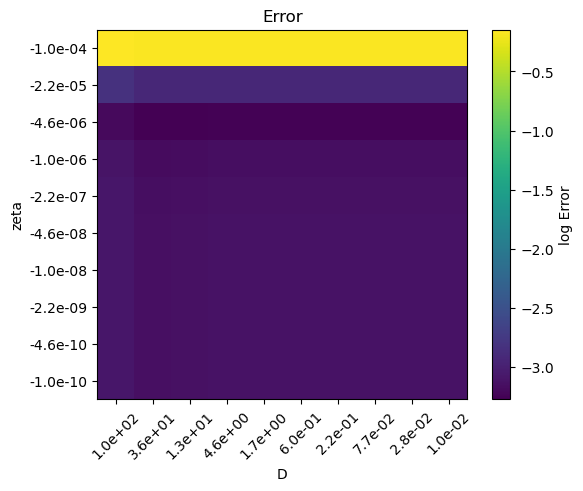

In [34]:

x_inds = np.arange(400, 450)
y_inds = np.arange(400, 450)
calanus = sinmod_c.sinmod_file.variables["calanus_finmarchicus"][:, :, :]

grid = Grid()
grid.make_regular_grid_from_axes(yc[y_inds], xc[x_inds])
dx = xc[1] - xc[0]
dy = yc[1] - yc[0]
dt = time_step_s[1] - time_step_s[0]

u = sinmod_c.sinmod_file.variables["u_east"][t_ind, :, y_inds, x_inds]
v = sinmod_c.sinmod_file.variables["v_north"][t_ind, :, y_inds, x_inds]

depth_inds = np.arange(0,5 )
zzeta = -10**np.linspace(-4, -10, 10)
#zzeta = np.concatenate((zzeta, -np.flip(zzeta)))
DD = 10**np.linspace(2, -2, 10)
#DD = np.concatenate((DD, -np.flip(DD)))

err = np.zeros((len(zzeta), len(DD)))
err_n = np.zeros((len(zzeta), len(DD)))
mse = np.zeros((len(zzeta), len(DD)))
mse_n = np.zeros((len(zzeta), len(DD)))

u_int = np.mean(u[depth_inds, :, :], axis=0)
v_int = np.mean(v[depth_inds, :, :], axis=0)

#u_int = uniform_filter(u_int, size=20)
#v_int = uniform_filter(v_int, size=20)

print("u_int.shape, v_int.shape", u_int.shape, v_int.shape)


calanus_t0 = sinmod_c.sinmod_file.variables["calanus_finmarchicus"][0, y_inds, x_inds]
#calanus_t0 = np.log(calanus_t0)
#calanus_t0 = uniform_filter(calanus_t0, size=20)
calanus_t0 = calanus_t0.flatten()

plt.imshow(calanus_t0.reshape(len(y_inds), len(x_inds)), cmap=cm.viridis, origin="lower")
plt.quiver(u_int, v_int,
        scale=5, 
        width=0.005,
        headwidth=0.3,
        headlength=0.5,
        headaxislength=4,
        alpha=0.5)
plt.colorbar()
plt.title("Calanus t0")
plt.show()



for i in range(len(zzeta)):
    for j in range(len(DD)):
        
        A = finding_A(u_int, v_int, D=DD[j], zeta=zzeta[i], dt=dt, dx=dx, dy=dy, grid=grid)
        

        calanus_pred_t1 = A @ calanus_t0
        
        calanus_t1 = sinmod_c.sinmod_file.variables["calanus_finmarchicus"][1, y_inds, x_inds]
        #calanus_t1 = np.log(calanus_t1)
        #calanus_t1 = uniform_filter(calanus_t1, size=20)

        if i == 0 and j == 0:
            plt.imshow(calanus_t1, cmap=cm.viridis, origin="lower")
            plt.colorbar()
            plt.title("Calanus t1")
            plt.show()
            

            plt.imshow(calanus_t1 - calanus_t0.reshape(len(y_inds), len(x_inds)), cmap=cm.viridis, origin="lower")
            plt.colorbar()
            plt.quiver(u_int, v_int,
                    scale=5, 
                    width=0.005,
                    headwidth=0.3,
                    headlength=0.5,
                    headaxislength=4,
                    alpha=0.5)
       
            plt.title("Calanus predicted t1")
            plt.show()
        calanus_t1 = calanus_t1.flatten()


        calanus_t1_reshape = calanus_t1.reshape(len(y_inds), len(x_inds))
        calanus_t0_reshape = calanus_t0.reshape(len(y_inds), len(x_inds))
        calanus_pred_t1_reshape = calanus_pred_t1.reshape(len(y_inds), len(x_inds))
        
        internal_inds = grid.get_internal_gi(d=2)
    
        diff_pred_t1_interal = calanus_pred_t1[internal_inds] - calanus_t1[internal_inds]
        sum_diff_pred_t1 = np.sum(diff_pred_t1_interal)
        diff_t0_t1 = np.abs(calanus_t1_reshape - calanus_t0_reshape)
        diff_pred_t1 = np.abs(calanus_pred_t1_reshape - calanus_t1_reshape)

        mse[i,j] = np.mean(diff_pred_t1_interal**2)
        mse_n[i,j] = np.mean(diff_t0_t1**2)

        diff_t1_t0_interal = np.abs(calanus_t1[internal_inds] - calanus_t0[internal_inds])
        sum_diff_t1_t0 = np.sum(diff_t1_t0_interal)
        
        err[i, j] = sum_diff_pred_t1
        err_n[i, j] = sum_diff_t1_t0
        print(f"zeta: {zzeta[i]:3f}, D: {DD[j]:.3f}, mse:{mse[i,j]:.3f}")


print(np.min(err), np.max(err))
print(np.min(err_n), np.max(err_n))
print(np.min(mse), np.max(mse))
print(np.min(mse_n), np.max(mse_n))
# Plot the error
# Log scale on the colorbar
# Get the lowes erro
plt.imshow(np.log(mse), cmap=cm.viridis)
plt.colorbar(label="log Error")
plt.title("Error")
plt.xlabel("D")
plt.ylabel("zeta")
plt.xticks(np.arange(len(DD)), [f"{d:.1e}" for d in DD], rotation=45)
plt.yticks(np.arange(len(zzeta)), [f"{z:.1e}" for z in zzeta])
plt.show()


In [ ]:
A_0 = finding_A(v, u, D=0, zeta=0, dt=0, dx=dx, dy=dy, grid=grid)
print("A_0", A_0)

A_0 [[1. 0. 0. ... 0. 0. 0.]
 [0. 1. 0. ... 0. 0. 0.]
 [0. 0. 1. ... 0. 0. 0.]
 ...
 [0. 0. 0. ... 1. 0. 0.]
 [0. 0. 0. ... 0. 1. 0.]
 [0. 0. 0. ... 0. 0. 1.]]


-198874191.14175165 388.26518032987315
199.1745147705078 199.1745147705078
0.03692187403323072 9633752709.064486
0.018077624961733818 0.018077624961733818


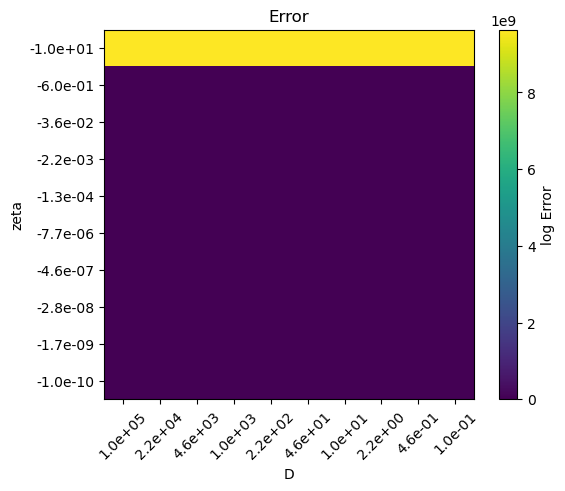

In [ ]:

x_inds = np.arange(400, 450)
y_inds = np.arange(400, 450)
calanus = sinmod_c.sinmod_file.variables["calanus_finmarchicus"][:, :, :]
grid = Grid()
grid.make_regular_grid_from_axes(yc[y_inds], xc[x_inds])


u = sinmod_c.sinmod_file.variables["u_east"][t_ind, :, y_inds, x_inds]
v = sinmod_c.sinmod_file.variables["v_north"][t_ind, :, y_inds, x_inds]



depth_inds = np.arange(0, 10)
zzeta = -10**np.linspace(-2, -6, 20)
#zzeta = np.concatenate((zzeta, -np.flip(zzeta)))
DD = 10**np.linspace(2, -1, 20)
#DD = np.concatenate((DD, -np.flip(DD)))

u_int = np.mean(u[depth_inds, :, :], axis=0)
v_int = np.mean(v[depth_inds, :, :], axis=0)


for k in depth_inds:
    err = np.zeros((len(zzeta), len(DD)))
    err_n = np.zeros((len(zzeta), len(DD)))
    mse = np.zeros((len(zzeta), len(DD)))
    mse_n = np.zeros((len(zzeta), len(DD)))

    u = sinmod_c.sinmod_file.variables["u_east"][t_ind, k, y_inds, x_inds]
    v = sinmod_c.sinmod_file.variables["v_north"][t_ind, k, y_inds, x_inds]

    min_v = 10000
    min_zeta = None
    min_D = None
    calanus_t0 = sinmod_c.sinmod_file.variables["calanus_finmarchicus"][t_ind, y_inds, x_inds]
    calanus_t0 = calanus_t0.flatten()
    calanus_t0_reshape = calanus_t0.reshape(len(y_inds), len(x_inds))
    calanus_t1 = sinmod_c.sinmod_file.variables["calanus_finmarchicus"][t_ind+1, y_inds, x_inds].flatten()
    #calanus_t1 = uniform_filter(calanus_t1, size=2)
    calanus_t1_reshape = calanus_t1.reshape(len(y_inds), len(x_inds))
    diff_t0_t1 = np.abs(calanus_t1_reshape - calanus_t0_reshape)
    calanus_pred_t1_b = np.zeros_like(calanus_t0)

    internal_inds = grid.get_internal_gi(d=2)

    for i in range(len(zzeta)):
        for j in range(len(DD)):
            
            A = finding_A(u, v, D=DD[j], zeta=zzeta[i], dt=dt*2, dx=dx, dy=dy, grid=grid, make_sparce=True)


            calanus_pred_t1 = A @ calanus_t0
            calanus_pred_t1_reshape = calanus_pred_t1.reshape(len(y_inds), len(x_inds))
            
            
        
            diff_pred_t1_interal = calanus_pred_t1[internal_inds] - calanus_t1[internal_inds]
            sum_diff_pred_t1 = np.sum(diff_pred_t1_interal)
            diff_t0_t1 = np.abs(calanus_t1_reshape - calanus_t0_reshape)
            diff_pred_t1 = np.abs(calanus_pred_t1_reshape - calanus_t1_reshape)

            mse[i,j] = np.mean(diff_pred_t1_interal**2)
            mse_n[i,j] = np.mean(diff_t0_t1**2)

            diff_t1_t0_interal = np.abs(calanus_t1[internal_inds] - calanus_t0[internal_inds])
            sum_diff_t1_t0 = np.sum(diff_t1_t0_interal)
            
            err[i, j] = sum_diff_pred_t1
            err_n[i, j] = sum_diff_t1_t0
            #print(f"zeta: {zzeta[i]:3f}, D: {DD[j]:.3f}, mse:{mse[i,j]:.3f}")


            if np.mean(diff_pred_t1_interal**2) < min_v:
                min_v = np.mean(diff_pred_t1_interal**2)
                min_zeta = zzeta[i]
                min_D = DD[j]
                calanus_pred_t1_b = calanus_pred_t1  

    print(f"depth: {k}")
    print(f"zeta: {min_zeta:.10f}, D: {min_D:.10f}, mse:{min_v:.10f}")

    print(np.min(err), np.max(err))
    print(np.min(err_n), np.max(err_n))
    print(np.min(mse), np.max(mse))
    print(np.min(mse_n), np.max(mse_n))
    # Plot the error
    # Log scale on the colorbar
    # Get the lowes erro
    plt.imshow(np.log(mse), cmap=cm.viridis)
    plt.colorbar(label="log Error")
    plt.title("Error")
    plt.xlabel("D")
    plt.ylabel("zeta")
    plt.xticks(np.arange(len(DD)), [f"{d:.1e}" for d in DD], rotation=45)
    plt.yticks(np.arange(len(zzeta)), [f"{z:.1e}" for z in zzeta])
    plt.show()

    fig, ax = plt.subplots(1, 3, figsize=(20, 10))  
    vmin = np.min((calanus_t1, calanus_pred_t1_b, calanus_t0))
    vmax = np.max((calanus_t1, calanus_pred_t1_b, calanus_t0))
    ax[0].imshow(calanus_t1.reshape(len(y_inds), len(x_inds)), cmap=cm.viridis, origin="lower", vmin=vmin, vmax=vmax)
    add_cbar(fig, ax[0], vmin=vmin, vmax=vmax, label="Calanus")
    ax[0].set_title("Calanus t1")
    ax[1].imshow(calanus_pred_t1_b.reshape(len(y_inds), len(x_inds)), cmap=cm.viridis, origin="lower", vmin=vmin, vmax=vmax)
    add_cbar(fig, ax[1], vmin=vmin, vmax=vmax, label="Calanus")
    ax[1].set_title("Calanus predicted")
    ax[2].imshow(calanus_t0.reshape(len(y_inds), len(x_inds)), cmap=cm.viridis, origin="lower", vmin=vmin, vmax=vmax)
    add_cbar(fig, ax[2], vmin=vmin, vmax=vmax, label="Calanus")
    ax[2].set_title("Calanus t0")
    plt.show()




KeyboardInterrupt: 

zeta: -0.000100, D: 31.623, mse:0.603
zeta: -0.000100, D: 26.367, mse:0.602
zeta: -0.000100, D: 21.984, mse:0.602
zeta: -0.000100, D: 18.330, mse:0.602
zeta: -0.000100, D: 15.283, mse:0.601
zeta: -0.000100, D: 12.743, mse:0.601
zeta: -0.000100, D: 10.625, mse:0.601
zeta: -0.000100, D: 8.859, mse:0.601
zeta: -0.000100, D: 7.386, mse:0.601
zeta: -0.000100, D: 6.158, mse:0.601
zeta: -0.000100, D: 5.135, mse:0.601
zeta: -0.000100, D: 4.281, mse:0.601
zeta: -0.000100, D: 3.570, mse:0.601
zeta: -0.000100, D: 2.976, mse:0.601
zeta: -0.000100, D: 2.482, mse:0.601
zeta: -0.000100, D: 2.069, mse:0.601
zeta: -0.000100, D: 1.725, mse:0.601
zeta: -0.000100, D: 1.438, mse:0.601
zeta: -0.000100, D: 1.199, mse:0.601
zeta: -0.000100, D: 1.000, mse:0.601
zeta: -0.000048, D: 31.623, mse:0.154
zeta: -0.000048, D: 26.367, mse:0.154
zeta: -0.000048, D: 21.984, mse:0.154
zeta: -0.000048, D: 18.330, mse:0.154
zeta: -0.000048, D: 15.283, mse:0.154
zeta: -0.000048, D: 12.743, mse:0.154
zeta: -0.000048, D: 10.62

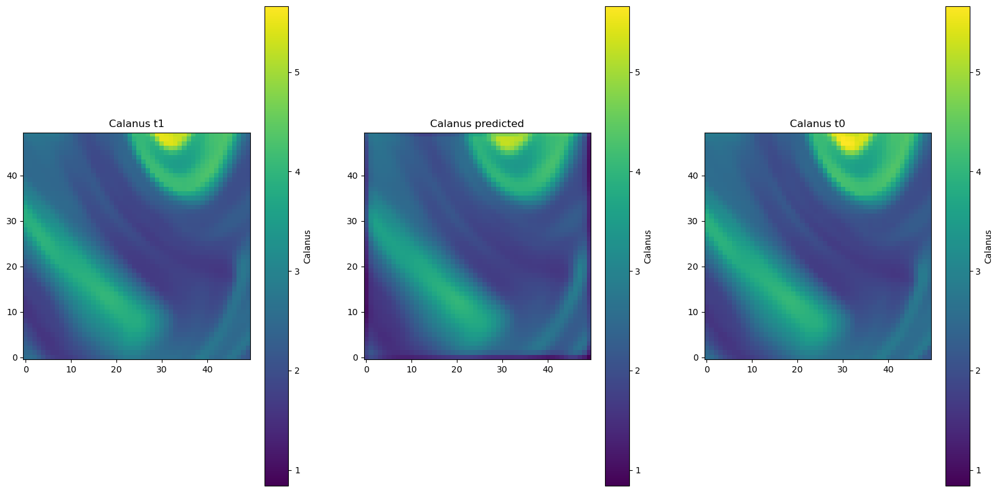

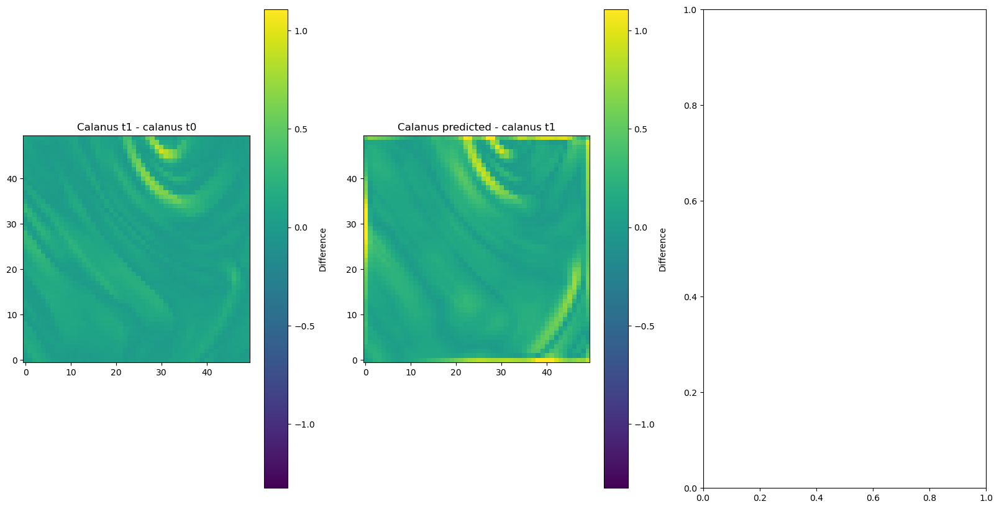

In [36]:
x_inds = np.arange(400, 450)
y_inds = np.arange(400, 450)
calanus = sinmod_c.sinmod_file.variables["calanus_finmarchicus"][:, :, :]
#v_min, v_max = np.min(calanus[y_inds,:][:,x_inds]), np.max(calanus[y_inds,:][:,x_inds])
grid = Grid()
grid.make_regular_grid_from_axes(yc[y_inds], xc[x_inds])

u = sinmod_c.sinmod_file.variables["u_east"][t_ind, :, y_inds, x_inds]
v = sinmod_c.sinmod_file.variables["v_north"][t_ind, :, y_inds, x_inds]

depth_inds = np.arange(0, 10)
zzeta = -10**np.linspace(-4, -10, 20)
DD = 10**np.linspace(1.5, 0, 20)


err = np.zeros((len(zzeta), len(DD)))
err_n = np.zeros((len(zzeta), len(DD)))
mse = np.zeros((len(zzeta), len(DD)))
mse_n = np.zeros((len(zzeta), len(DD)))

u_int = np.mean(u[depth_inds, :, :], axis=0)
v_int = np.mean(v[depth_inds, :, :], axis=0)

best_mse = 100000
best_zeta = None
best_D = None
calanus_pred_t1_b = None

for i in range(len(zzeta)):
    for j in range(len(DD)):

        A = finding_A(u_int, v_int, D=DD[j], zeta=zzeta[i], dt=dt / 10, dx=dx, dy=dy, grid=grid)
        calanus_t0 = sinmod_c.sinmod_file.variables["calanus_finmarchicus"][0, y_inds, x_inds]
        calanus_t0 = calanus_t0.flatten()

        
        
        calanus_pred_t1 = calanus_t0.copy()
        for _ in range(10):
            calanus_pred_t1 = A @ calanus_pred_t1
        
        calanus_t1 = sinmod_c.sinmod_file.variables["calanus_finmarchicus"][1, y_inds, x_inds].flatten()


        calanus_t1_reshape = calanus_t1.reshape(len(y_inds), len(x_inds))
        calanus_t0_reshape = calanus_t0.reshape(len(y_inds), len(x_inds))
        calanus_pred_t1_reshape = calanus_pred_t1.reshape(len(y_inds), len(x_inds))
        
        internal_inds = grid.get_internal_gi(d=3)
    
        diff_pred_t1_interal = calanus_pred_t1[internal_inds] - calanus_t1[internal_inds]
        sum_diff_pred_t1 = np.sum(diff_pred_t1_interal)
        diff_t0_t1 = np.abs(calanus_t1_reshape - calanus_t0_reshape)
        diff_pred_t1 = np.abs(calanus_pred_t1_reshape - calanus_t1_reshape)

        mse[i,j] = np.mean(diff_pred_t1_interal**2)
        mse_n[i,j] = np.mean(diff_t0_t1**2)

        diff_t1_t0_interal = np.abs(calanus_t1[internal_inds] - calanus_t0[internal_inds])
        sum_diff_t1_t0 = np.sum(diff_t1_t0_interal)
        
        err[i, j] = sum_diff_pred_t1
        err_n[i, j] = sum_diff_t1_t0
        print(f"zeta: {zzeta[i]:3f}, D: {DD[j]:.3f}, mse:{mse[i,j]:.3f}")

        if mse[i,j] < best_mse:
            best_mse = mse[i,j]
            best_zeta = zzeta[i]
            best_D = DD[j]
            calanus_pred_t1_b = calanus_pred_t1


print(f"best zeta: {best_zeta:.10f}, best D: {best_D:.10f}, mse:{best_mse:.10f}")

fig, ax = plt.subplots(1, 3, figsize=(20, 10))
vmin = np.min((calanus_t1, calanus_pred_t1_b, calanus_t0))
vmax = np.max((calanus_t1, calanus_pred_t1_b, calanus_t0))
ax[0].imshow(calanus_t1.reshape(len(y_inds), len(x_inds)), cmap=cm.viridis, origin="lower", vmin=vmin, vmax=vmax)
add_cbar(fig, ax[0], vmin=vmin, vmax=vmax, label="Calanus")
ax[0].set_title("Calanus t1")
ax[1].imshow(calanus_pred_t1_b.reshape(len(y_inds), len(x_inds)), cmap=cm.viridis, origin="lower", vmin=vmin, vmax=vmax)
add_cbar(fig, ax[1], vmin=vmin, vmax=vmax, label="Calanus")
ax[1].set_title("Calanus predicted")
ax[2].imshow(calanus_t0.reshape(len(y_inds), len(x_inds)), cmap=cm.viridis, origin="lower", vmin=vmin, vmax=vmax)
add_cbar(fig, ax[2], vmin=vmin, vmax=vmax, label="Calanus")
ax[2].set_title("Calanus t0")
plt.show()


fig, ax = plt.subplots(1, 3, figsize=(20, 10))
diff = np.abs(calanus_t0_reshape - calanus_t1_reshape)
diff_min = np.min(diff)
diff_max = np.max(diff)
diff_n = calanus_pred_t1_reshape - calanus_t1_reshape
diff_n_min = np.min(diff_n)
diff_n_max = np.max(diff_n)
ax[0].imshow(np.abs(calanus_t0_reshape - calanus_t1_reshape), cmap=cm.viridis, origin="lower" , vmin=diff_n_min, vmax=diff_n_max)
add_cbar(fig, ax[0], vmin=diff_n_min, vmax=diff_n_max, label="Difference")
ax[0].set_title(f"Calanus t1 - calanus t0")
ax[0].set_title("Calanus t1 - calanus t0")
ax[1].imshow(np.abs(calanus_pred_t1_reshape - calanus_t1_reshape), cmap=cm.viridis, origin="lower" , vmin=diff_n_min, vmax=diff_n_max)
add_cbar(fig, ax[1], vmin=diff_n_min, vmax=diff_n_max, label="Difference")
ax[1].set_title("Calanus predicted - calanus t1")
plt.show()




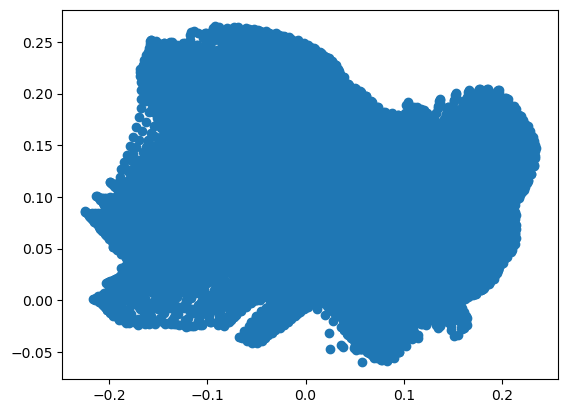

In [37]:
plt.scatter(u,v)

plt.show()

t: 0, A time: 3.198
t: 0, mse_0: 0.007, mse_pred: 49.326


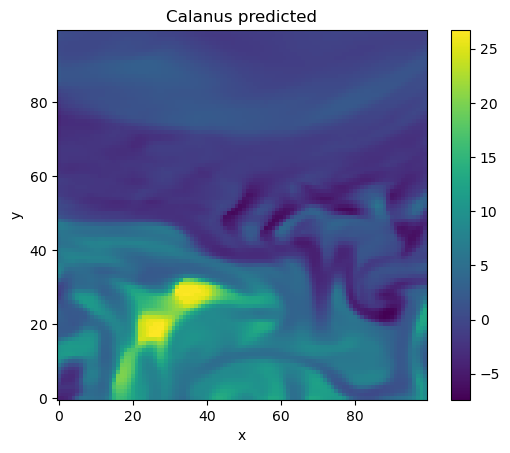

t: 1, A time: 2.526
t: 1, mse_0: 0.022, mse_pred: 49.246


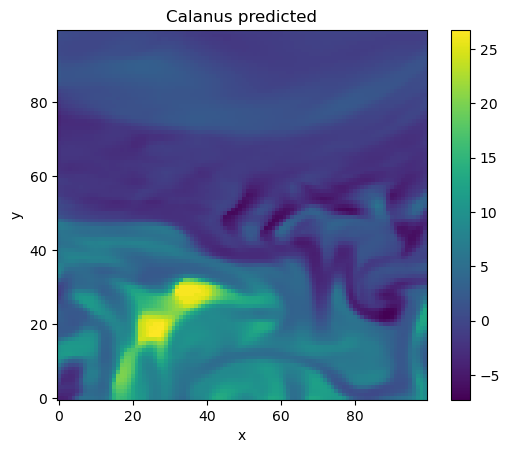

t: 2, A time: 3.430
t: 2, mse_0: 0.040, mse_pred: 49.158


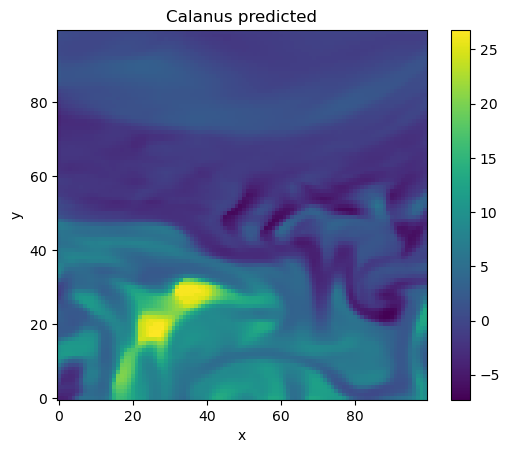

t: 3, A time: 2.685
t: 3, mse_0: 0.056, mse_pred: 49.106


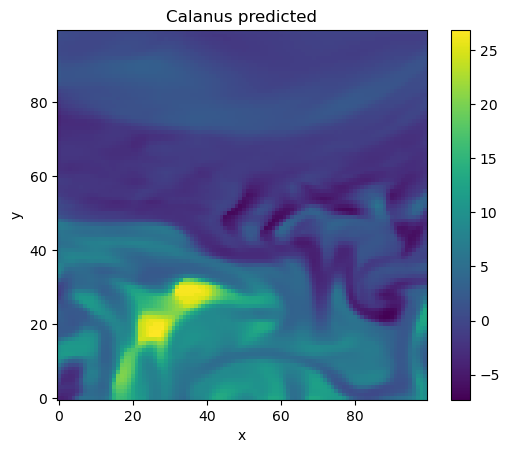

t: 4, A time: 2.445
t: 4, mse_0: 0.071, mse_pred: 49.058


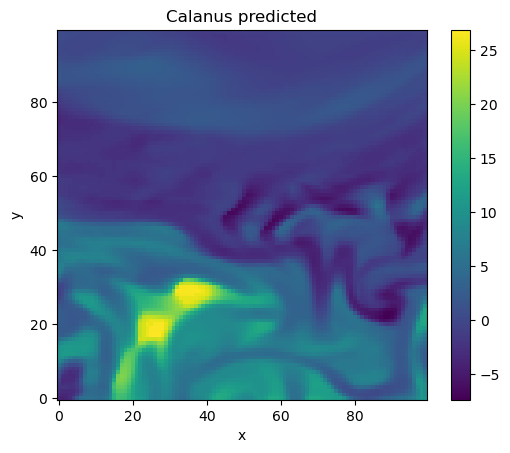

t: 5, A time: 3.183
t: 5, mse_0: 0.085, mse_pred: 49.022


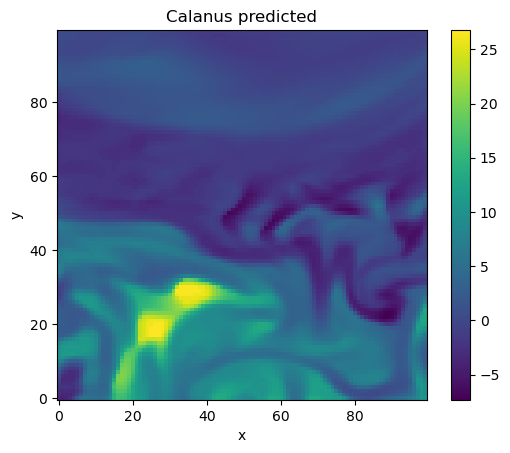

t: 6, A time: 3.184
t: 6, mse_0: 0.100, mse_pred: 49.009


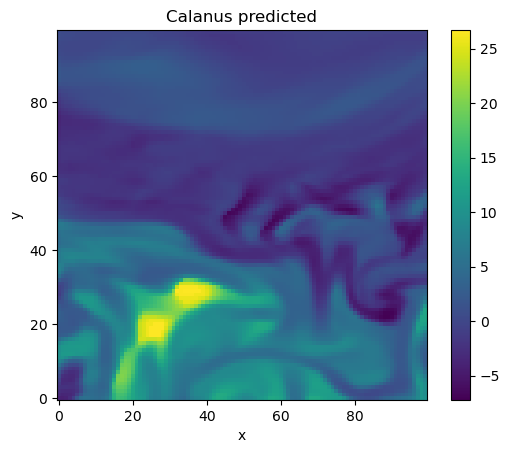

t: 7, A time: 2.988
t: 7, mse_0: 0.115, mse_pred: 48.961


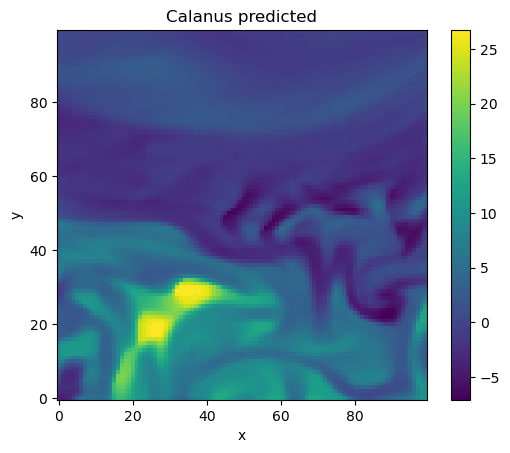

t: 8, A time: 2.783
t: 8, mse_0: 0.133, mse_pred: 48.895


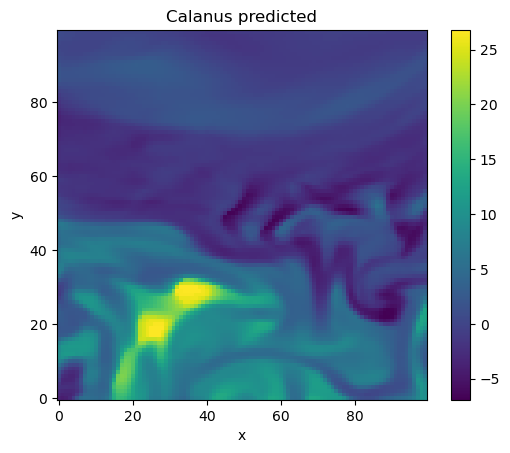

t: 9, A time: 2.910
t: 9, mse_0: 0.154, mse_pred: 48.773


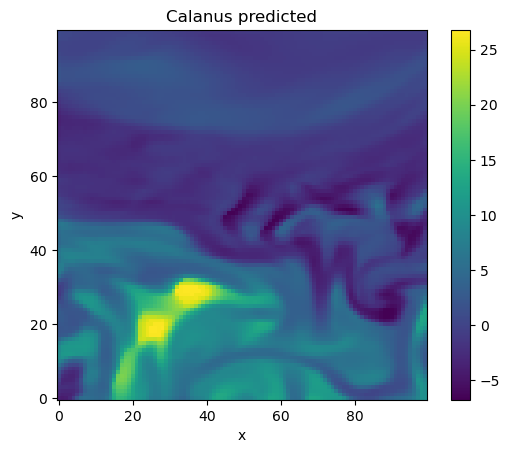

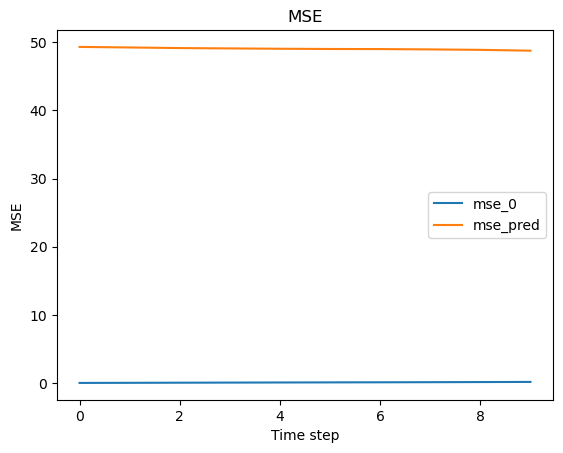

In [38]:
t0 = 0
y_inds = np.arange(200,300)
x_inds = np.arange(300,400)
calanus_0 = sinmod_c.sinmod_file.variables["calanus_finmarchicus"][0, y_inds, x_inds]
calanus_0 = np.log(calanus_0.flatten() + 1e-10)
depth_ind = 2
zeta = -0.002
D = 2
grid = Grid()
grid.make_regular_grid_from_axes(yc[y_inds], xc[x_inds])
internal_inds = grid.get_internal_gi(d=10)

calanus_prd = np.zeros_like(calanus_0)


m = 10
mse_0 = np.zeros(m)
mse_pred = np.zeros(m)

for i in range(0,m):
    u = sinmod_c.sinmod_file.variables["u_east"][i, depth_ind, y_inds, x_inds]
    v = sinmod_c.sinmod_file.variables["v_north"][i, depth_ind, y_inds, x_inds]
    tim1 = time.time()
    A = finding_A(u,v, D=D, zeta=zeta, dt=dt , dx=dx, dy=dy, grid=grid, make_sparce=True)
    tim2 = time.time()
    print(f"t: {i}, A time: {tim2-tim1:.3f}")
    calanus_prd = A @ calanus_0

    calanus_true = sinmod_c.sinmod_file.variables["calanus_finmarchicus"][i+1, y_inds, x_inds].flatten()
    calanus_true = np.log(calanus_true + 1e-10)

    mse_0[i] = np.mean((calanus_true[internal_inds] - calanus_0[internal_inds])**2)
    mse_pred[i] = np.mean((calanus_prd[internal_inds] - calanus_true[internal_inds])**2)
    print(f"t: {i}, mse_0: {mse_0[i]:.3f}, mse_pred: {mse_pred[i]:.3f}")

    plt.imshow(calanus_prd.reshape(len(y_inds), len(x_inds)), cmap=cm.viridis, origin="lower")
    plt.colorbar()
    plt.title("Calanus predicted")
    plt.xlabel("x")
    plt.ylabel("y")
    plt.show()
    

plt.plot(np.arange(0,m), mse_0, label="mse_0")  
plt.plot(np.arange(0,m), mse_pred, label="mse_pred")
plt.xlabel("Time step")
plt.ylabel("MSE")
plt.title("MSE")
plt.legend()
plt.show()

In [ ]:
calanus_0 = sinmod_c.sinmod_file.variables["calanus_finmarchicus"][0, y_inds, x_inds].flatten()
calanus_1 = sinmod_c.sinmod_file.variables["calanus_finmarchicus"][1, y_inds, x_inds].flatten()
calanus_2 = sinmod_c.sinmod_file.variables["calanus_finmarchicus"][2, y_inds, x_inds].flatten()
zeta = 0
D = 0
t_ind = 0
u = sinmod_c.sinmod_file.variables["u_east"][t_ind, 5, y_inds, x_inds].flatten()
v = sinmod_c.sinmod_file.variables["v_north"][t_ind, 5, y_inds, x_inds].flatten()
grid = Grid()
grid.make_regular_grid_from_axes(yc[y_inds], xc[x_inds])
internal_inds = grid.get_internal_gi(d=2)
t = np.linspace(0, 2, 20)
mse = np.zeros(len(t))
mse_pred = np.zeros(len(t))
for i in range(len(t)):
    interp = (1-t[i]) * calanus_0 + (t[i]) * calanus_1
    A = finding_A(u, v, D=D, zeta=zeta, dt=dt * t[i] , dx=dx, dy=dy, grid=grid)
    calanus_pred_t1 = A @ calanus_0
    mse[i] = np.mean((interp[internal_inds] - calanus_1[internal_inds])**2)
    mse_pred[i] = np.mean((calanus_1[internal_inds] - calanus_pred_t1[internal_inds])**2)
plt.plot(t, mse)
plt.plot(t, mse_pred)
plt.xlabel("t")
plt.ylabel("MSE")
plt.title("MSE of interpolation")
plt.show()

-133.8047659987718 72.24764320726567
184.122802734375 184.122802734375
0.014991039575624494 0.0270262468464348
0.018077624961733818 0.018077624961733818


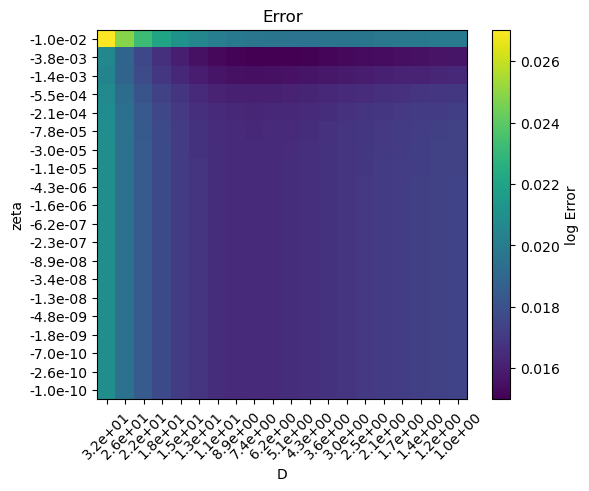

In [ ]:
print(np.min(err), np.max(err))
print(np.min(err_n), np.max(err_n))
print(np.min(mse), np.max(mse))
print(np.min(mse_n), np.max(mse_n))
# Plot the error
# Log scale on the colorbar
# Get the lowes erro
plt.imshow(mse, cmap=cm.viridis)
plt.colorbar(label="log Error")
plt.title("Error")
plt.xlabel("D")
plt.ylabel("zeta")
plt.xticks(np.arange(len(DD)), [f"{d:.1e}" for d in DD], rotation=45)
plt.yticks(np.arange(len(zzeta)), [f"{z:.1e}" for z in zzeta])
plt.show()